# Libraries

In [ ]:
import os

In [ ]:
!pip install ipython-autotime
%load_ext autotime

time: 161 µs (started: 2021-04-06 05:06:45 +00:00)


In [ ]:
# Python interface to PROJ (cartographic projections and coordinate transformations library)
!pip install pyproj

# R-Tree spatial index for Python GIS
!pip install Rtree

     |████████████████████████████████| 6.5MB 5.9MB/s 
     |████████████████████████████████| 1.0MB 4.0MB/s 
time: 7.69 s (started: 2021-04-06 05:06:48 +00:00)


In [ ]:
#1. GeoPandas is a project to add support for geographic data to pandas objects (work with spatial data)
!pip install geopandas

#2. encode categorical data
!pip install category-encoders

#3. Local Interpretable Model-Agnostic Explanations for machine learning classifiers
!pip install lime

     |████████████████████████████████| 1.0MB 4.4MB/s 
     |████████████████████████████████| 14.8MB 297kB/s 
     |████████████████████████████████| 81kB 3.3MB/s 
     |████████████████████████████████| 276kB 5.6MB/s 
  Created wheel for lime: filename=lime-0.2.0.1-cp37-none-any.whl size=283846 sha256=c0ade7abe320223fac7986eea6395c490ec9c912518a7292c82a88bc16edff2e
  Stored in directory: /root/.cache/pip/wheels/4c/4f/a5/0bc765457bd41378bf3ce8d17d7495369d6e7ca3b712c60c89
Successfully built lime
time: 14.9 s (started: 2021-04-06 05:06:58 +00:00)


In [ ]:
!pip install mapclassify

time: 3.23 s (started: 2021-04-06 05:07:19 +00:00)


In [ ]:
import geopandas as gpd

time: 266 ms (started: 2021-04-06 05:07:25 +00:00)


In [1]:
## for data
# Import Data.csv with Pandas
import pandas as pd
import numpy as np

import pandas.util.testing as tm

## for plotting
# matplotlib: is a plotting library for Python programming language
# pyplot module is a simple interface for matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

## for statistical tests
import scipy
import statsmodels.formula.api as smf
import statsmodels.api as sm

## for machine learning
from sklearn import model_selection, preprocessing, feature_selection, ensemble, linear_model, metrics, decomposition

## for explainer
#from lime import lime_tabular

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  


# I. DATA PREPARATION

# 1 Load Dataset

In [27]:
# Define relative path to file
EDAsurvey = pd.read_csv('/content/drive/My Drive/EDA/EDAsurvey.csv')
EDAsurvey.head(3)

,x,y,siteindex,aspect,planCurvature,profileCurvature,slope,TPI,TWI_SAGA,catchmentArea_SAGA,SVF_simplified,Gh_total,Dh_diffuse,Ih_direct,DEM,distFromCoast,meanJanRain,meanJulRain,maxJanTemp,minJulTemp,RCODE,SYMBOL,DESCRIPT,soil_order,BDw,CLY,CFG,ECD,SOC,pHw,SND,SLT
0,508985,5452015,27.914452,58.561249,0.002594,0.000163,5.779576,-1.204296,8.033133,2934.342773,0.997453,8.703231,1.359027,7.344204,54.816718,5.945354,4.617585,111.933050,24.504642,5.596159,7497,Ts,"Dominantly non-marine sequences of gravel, sa...",Kurosol,1.018121,12.715149,1.777616,0.621924,3.254319,5.665130,75.630202,11.654650
1,508975,5452035,27.615402,49.200798,-0.007862,-0.001871,5.366687,-1.327446,9.179167,8988.151001,0.997771,8.719011,1.359776,7.359235,52.767088,5.931636,4.569838,111.762547,24.511998,5.604992,7497,Ts,"Dominantly non-marine sequences of gravel, sa...",Kurosol,1.019250,13.161926,1.803848,0.635599,3.237924,5.732380,75.776229,11.061845
2,508975,5452045,27.474239,50.445107,0.002370,-0.002682,5.156123,-1.308731,9.393249,11018.754150,0.997950,8.715564,1.360110,7.355454,52.174048,5.922603,4.552800,111.699702,24.514470,5.608177,7497,Ts,"Dominantly non-marine sequences of gravel, sa...",Kurosol,1.019314,13.208274,1.805538,0.635770,3.236828,5.736364,75.738196,11.053531


In [14]:
# check database dimensions
print('Examples:{}\nFeatures: {}'.format(EDAsurvey.shape[0], EDAsurvey.shape[1]))
#OUTPUT: (953556, 32)

Examples:953556
Features: 32


# 2 Cleaning: drop RCODE and DESCRIPT

In [28]:
# Remove column  RCODE and DESCRIPT for ML
EDAsurvey.drop(['RCODE', 'DESCRIPT'], inplace = True, axis = 1) 
EDAsurvey.head(3)

,x,y,siteindex,aspect,planCurvature,profileCurvature,slope,TPI,TWI_SAGA,catchmentArea_SAGA,SVF_simplified,Gh_total,Dh_diffuse,Ih_direct,DEM,distFromCoast,meanJanRain,meanJulRain,maxJanTemp,minJulTemp,SYMBOL,soil_order,BDw,CLY,CFG,ECD,SOC,pHw,SND,SLT
0,508985,5452015,27.914452,58.561249,0.002594,0.000163,5.779576,-1.204296,8.033133,2934.342773,0.997453,8.703231,1.359027,7.344204,54.816718,5.945354,4.617585,111.933050,24.504642,5.596159,Ts,Kurosol,1.018121,12.715149,1.777616,0.621924,3.254319,5.665130,75.630202,11.654650
1,508975,5452035,27.615402,49.200798,-0.007862,-0.001871,5.366687,-1.327446,9.179167,8988.151001,0.997771,8.719011,1.359776,7.359235,52.767088,5.931636,4.569838,111.762547,24.511998,5.604992,Ts,Kurosol,1.019250,13.161926,1.803848,0.635599,3.237924,5.732380,75.776229,11.061845
2,508975,5452045,27.474239,50.445107,0.002370,-0.002682,5.156123,-1.308731,9.393249,11018.754150,0.997950,8.715564,1.360110,7.355454,52.174048,5.922603,4.552800,111.699702,24.514470,5.608177,Ts,Kurosol,1.019314,13.208274,1.805538,0.635770,3.236828,5.736364,75.738196,11.053531


In [16]:
EDAsurvey.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 953556 entries, 0 to 953555
Data columns (total 30 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   x                   953556 non-null  int64  
 1   y                   953556 non-null  int64  
 2   siteindex           953556 non-null  float64
 3   aspect              953556 non-null  float64
 4   planCurvature       953556 non-null  float64
 5   profileCurvature    953556 non-null  float64
 6   slope               953556 non-null  float64
 7   TPI                 953556 non-null  float64
 8   TWI_SAGA            953556 non-null  float64
 9   catchmentArea_SAGA  953556 non-null  float64
 10  SVF_simplified      953556 non-null  float64
 11  Gh_total            953556 non-null  float64
 12  Dh_diffuse          953556 non-null  float64
 13  Ih_direct           953556 non-null  float64
 14  DEM                 953556 non-null  float64
 15  distFromCoast       953556 non-nul

# II. PRE-PROCESSING

# 1 Categorical Data

## 1.1 For Descriptive Statistics

### a) Extract categorical values encoded

In [30]:
# soil_order values
mean = EDAsurvey.siteindex.mean()
agg = EDAsurvey.groupby('soil_order')['siteindex'].agg(['count', 'mean'])
counts = agg['count']
means = agg['mean']

smoothSoil = (counts * means + 5 * mean) / (counts + 5)
smoothSoil

soil_order
Chromosol    30.574759
Dermosol     27.540958
Ferrosol     32.084894
Kurosol      30.859481
Sodosol      28.982688
dtype: float64

In [29]:
# soil_order values
mean = EDAsurvey.siteindex.mean()
agg = EDAsurvey.groupby('soil_order')['siteindex'].agg(['count', 'mean'])
counts = agg['count']
means = agg['mean']

Soil = (counts * means) / (counts)
Soil

soil_order
Chromosol    30.575130
Dermosol     27.540946
Ferrosol     32.085017
Kurosol      30.859531
Sodosol      28.982689
dtype: float64

In [19]:
# sort values ascending
smoothSoil.sort_values()

soil_order
Dermosol     27.540958
Sodosol      28.982688
Chromosol    30.574759
Kurosol      30.859481
Ferrosol     32.084894
dtype: float64

In [20]:
# geology SYMBOL values
mean = EDAsurvey.siteindex.mean()
agg = EDAsurvey.groupby('SYMBOL')['siteindex'].agg(['count', 'mean'])
counts = agg['count']
means = agg['mean']

smoothGeol = (counts * means + 29 * mean) / (counts + 29)
smoothGeol

SYMBOL
CO      33.183757
COc     28.180196
COs     27.004697
Cda     34.865489
Cds     33.348038
Cdsv    29.596516
Cdt     33.466185
Cqfp    31.326446
Jd      29.033919
Lap     31.131506
Lt      36.485792
Os      33.776136
Ott     31.973525
P       32.503405
Pf      28.160595
Pl      32.498817
Pt      30.529839
Pu      28.007961
Q       27.809453
Qh      31.741513
Qpt     29.204165
Rvc     27.845767
SDp     24.933032
SDpl    32.435114
SDpr    31.015841
SDps    24.697481
SDpy    29.251284
Tb      30.333898
Ts      29.526195
dtype: float64

In [21]:
# geology SYMBOL values
mean = EDAsurvey.siteindex.mean()
agg = EDAsurvey.groupby('SYMBOL')['siteindex'].agg(['count', 'mean'])
counts = agg['count']
means = agg['mean']

Geol = (counts * means + 0 * mean) / (counts + 0)
Geol

SYMBOL
CO      33.193822
COc     28.153735
COs     26.843277
Cda     34.927408
Cds     33.360299
Cdsv    29.599146
Cdt     33.477833
Cqfp    31.333472
Jd      29.033964
Lap     31.642544
Lt      36.502828
Os      33.801893
Ott     31.979659
P       32.508990
Pf      28.159990
Pl      32.499479
Pt      30.543747
Pu      27.913657
Q       27.807879
Qh      31.746087
Qpt     29.204358
Rvc     27.407539
SDp     24.932468
SDpl    32.443740
SDpr    31.016315
SDps    24.696424
SDpy    29.251799
Tb      30.335265
Ts      29.526862
dtype: float64

In [22]:
# sort GEOLOGY values ascending
smoothGeol.sort_values()

SYMBOL
SDps    24.697481
SDp     24.933032
COs     27.004697
Q       27.809453
Rvc     27.845767
Pu      28.007961
Pf      28.160595
COc     28.180196
Jd      29.033919
Qpt     29.204165
SDpy    29.251284
Ts      29.526195
Cdsv    29.596516
Tb      30.333898
Pt      30.529839
SDpr    31.015841
Lap     31.131506
Cqfp    31.326446
Qh      31.741513
Ott     31.973525
SDpl    32.435114
Pl      32.498817
P       32.503405
CO      33.183757
Cds     33.348038
Cdt     33.466185
Os      33.776136
Cda     34.865489
Lt      36.485792
dtype: float64

### b.1) Plot siteindex group by soil classification

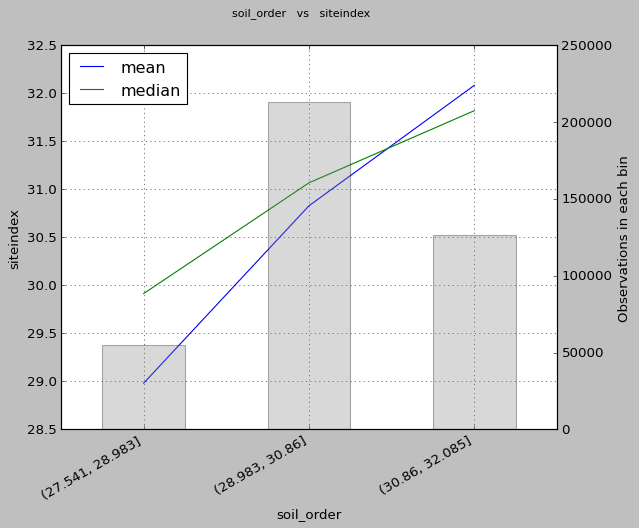

In [33]:
x, y = "soil_order", "siteindex"
plt.style.use('classic')

### bin plot
EDAsurvey_noNan = EDAsurvey[EDAsurvey[x].notnull()]
breaks = np.quantile(EDAsurvey_noNan[x], q=np.linspace(0, 1, 11))
groups = EDAsurvey_noNan.groupby([pd.cut(EDAsurvey_noNan[x], bins=breaks, 
           duplicates='drop')])[y].agg(['mean','median','size'])

fig, ax = plt.subplots()
#fig, ax = plt.subplots(nrows=2, ncols=2,  sharex=False, sharey=False)
#fig.suptitle(x+"   vs   "+y, fontsize=20)
fig.set_size_inches(8, 6)

fig.suptitle(x+"   vs   "+y, fontsize=10)
groups[["mean", "median"]].plot(kind="line", ax=ax)
groups["size"].plot(kind="bar", ax=ax, rot=45, secondary_y=True,
                    color="grey", alpha=0.3, grid=True)
ax.set(ylabel=y)
ax.right_ax.set_ylabel("Observations in each bin")
plt.setp(ax.get_xticklabels(), rotation=30, ha='right')

### scatter plot
#sns.jointplot(x=x, y=y, data=EDAsurvey, dropna=True, kind='reg')
plt.savefig('SOILvsSITE.png', bbox_inches='tight', dpi=300)

[None, None, None, None, None, None]

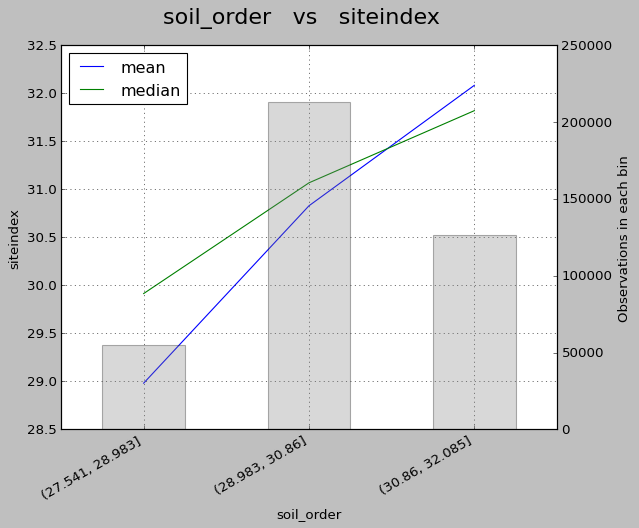

In [34]:
x, y = "soil_order", "siteindex"

### bin plot
EDAsurvey_noNan = EDAsurvey[EDAsurvey[x].notnull()]
breaks = np.quantile(EDAsurvey_noNan[x], q=np.linspace(0, 1, 11))
groups = EDAsurvey_noNan.groupby([pd.cut(EDAsurvey_noNan[x], bins=breaks, 
           duplicates='drop')])[y].agg(['mean','median','size'])

fig, ax = plt.subplots()
#fig, ax = plt.subplots(nrows=2, ncols=2,  sharex=False, sharey=False)
#fig.suptitle(x+"   vs   "+y, fontsize=20)
fig.set_size_inches(8, 6)

fig.suptitle(x+"   vs   "+y, fontsize=20)
groups[["mean", "median"]].plot(kind="line", ax=ax)
groups["size"].plot(kind="bar", ax=ax, rot=45, secondary_y=True,
                    color="grey", alpha=0.3, grid=True)
ax.set(ylabel=y)
ax.right_ax.set_ylabel("Observations in each bin")
plt.setp(ax.get_xticklabels(), rotation=30, ha='right')

### b.2) Plot siteindex group by geology structure

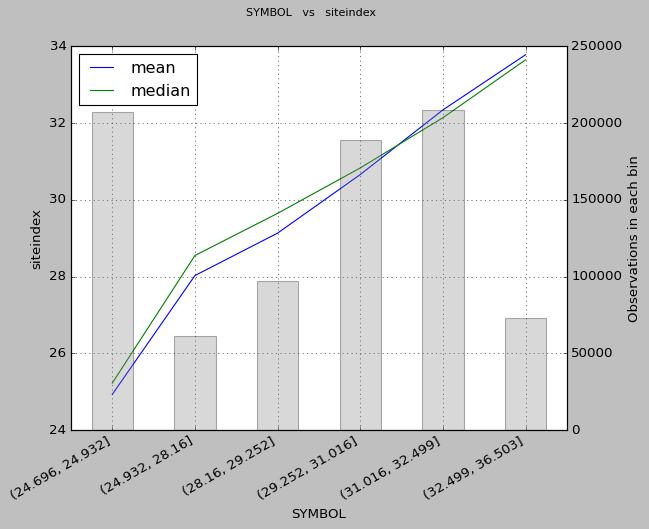

time: 1.36 s


In [ ]:
x, y = "SYMBOL", "siteindex"
plt.style.use('classic')
### bin plot
EDAsurvey_noNan = EDAsurvey[EDAsurvey[x].notnull()]
breaks = np.quantile(EDAsurvey_noNan[x], q=np.linspace(0, 1, 11))
groups = EDAsurvey_noNan.groupby([pd.cut(EDAsurvey_noNan[x], bins=breaks, 
           duplicates='drop')])[y].agg(['mean','median','size'])

fig, ax = plt.subplots()
#fig, ax = plt.subplots(nrows=2, ncols=2,  sharex=False, sharey=False)
#fig.suptitle(x+"   vs   "+y, fontsize=20)
fig.set_size_inches(8, 6)

fig.suptitle(x+"   vs   "+y, fontsize=10)
groups[["mean", "median"]].plot(kind="line", ax=ax)
groups["size"].plot(kind="bar", ax=ax, rot=45, secondary_y=True,
                    color="grey", alpha=0.3, grid=True)
ax.set(ylabel=y)
ax.right_ax.set_ylabel("Observations in each bin")
plt.setp(ax.get_xticklabels(), rotation=30, ha='right')

### scatter plot
#sns.jointplot(x=x, y=y, data=EDAsurvey, dropna=True, kind='reg')
plt.savefig('GEOLvsSITE.png', bbox_inches='tight', dpi=300)

In [ ]:
import statistics
from scipy import stats

# Use stats. function to describe the mean of observations
stats.describe(EDAsurvey.SYMBOL)

DescribeResult(nobs=953556, minmax=(24.697480600497528, 36.485791999975575), mean=28.962667390307836, variance=10.87790935341574, skewness=-0.08873828140615538, kurtosis=-1.345323336813257)

## 1.2 Target Encoding 

In [ ]:
# 1. OPTION 1
def calc_mean(EDAsurvey, by, on, m):
    # Compute the global mean
    mean = EDAsurvey[on].mean()

    # Compute the number of values and the mean of each group
    agg = EDAsurvey.groupby(by)[on].agg(['count', 'mean'])
    counts = agg['count']
    means = agg['mean']

    # Compute the "smoothed" means
    TargEnc = (counts * means) / (counts)

    # Replace each value by the according smoothed mean
    return EDAsurvey[by].map(TargEnc)

In [ ]:
EDAsurvey.loc[:, 'SYMBOL'] = calc_mean(EDAsurvey, by='SYMBOL', on='siteindex', m=0)
EDAsurvey.loc[:, 'soil_order'] = calc_mean(EDAsurvey, by='soil_order', on='siteindex', m=0)
EDAsurvey.head(3)

,x,y,siteindex,aspect,planCurvature,profileCurvature,slope,TPI,TWI_SAGA,catchmentArea_SAGA,SVF_simplified,Gh_total,Dh_diffuse,Ih_direct,DEM,distFromCoast,meanJanRain,meanJulRain,maxJanTemp,minJulTemp,SYMBOL,soil_order,BDw,CLY,CFG,ECD,SOC,pHw,SND,SLT
0,508985,5452015,27.914452,58.561249,0.002594,0.000163,5.779576,-1.204296,8.033133,2934.342773,0.997453,8.703231,1.359027,7.344204,54.816718,5.945354,4.617585,111.933050,24.504642,5.596159,29.526862,30.859531,1.018121,12.715149,1.777616,0.621924,3.254319,5.665130,75.630202,11.654650
1,508975,5452035,27.615402,49.200798,-0.007862,-0.001871,5.366687,-1.327446,9.179167,8988.151001,0.997771,8.719011,1.359776,7.359235,52.767088,5.931636,4.569838,111.762547,24.511998,5.604992,29.526862,30.859531,1.019250,13.161926,1.803848,0.635599,3.237924,5.732380,75.776229,11.061845
2,508975,5452045,27.474239,50.445107,0.002370,-0.002682,5.156123,-1.308731,9.393249,11018.754150,0.997950,8.715564,1.360110,7.355454,52.174048,5.922603,4.552800,111.699702,24.514470,5.608177,29.526862,30.859531,1.019314,13.208274,1.805538,0.635770,3.236828,5.736364,75.738196,11.053531


# 2 Features selection?

## 2.1 Correlation Analysis: Spearman

In [40]:
# 1.create a copy of dataframe
EDAsurveyCORR = EDAsurvey.copy()

# Remove column  RCODE and DESCRIPT for ML
#EDAsurveyCORR.drop(['x', 'y'], inplace = True, axis = 1) 
EDAsurveyCORR.head(3)

,x,y,siteindex,aspect,planCurvature,profileCurvature,slope,TPI,TWI_SAGA,catchmentArea_SAGA,SVF_simplified,Gh_total,Dh_diffuse,Ih_direct,DEM,distFromCoast,meanJanRain,meanJulRain,maxJanTemp,minJulTemp,SYMBOL,soil_order,BDw,CLY,CFG,ECD,SOC,pHw,SND,SLT
0,508985,5452015,27.914452,58.561249,0.002594,0.000163,5.779576,-1.204296,8.033133,2934.342773,0.997453,8.703231,1.359027,7.344204,54.816718,5.945354,4.617585,111.933050,24.504642,5.596159,29.526862,30.859531,1.018121,12.715149,1.777616,0.621924,3.254319,5.665130,75.630202,11.654650
1,508975,5452035,27.615402,49.200798,-0.007862,-0.001871,5.366687,-1.327446,9.179167,8988.151001,0.997771,8.719011,1.359776,7.359235,52.767088,5.931636,4.569838,111.762547,24.511998,5.604992,29.526862,30.859531,1.019250,13.161926,1.803848,0.635599,3.237924,5.732380,75.776229,11.061845
2,508975,5452045,27.474239,50.445107,0.002370,-0.002682,5.156123,-1.308731,9.393249,11018.754150,0.997950,8.715564,1.360110,7.355454,52.174048,5.922603,4.552800,111.699702,24.514470,5.608177,29.526862,30.859531,1.019314,13.208274,1.805538,0.635770,3.236828,5.736364,75.738196,11.053531


In [ ]:
# 2.correlation with Spearman
spearmancorr = EDAsurveyCORR.corr(method='spearman')
spearmancorr

,siteindex,aspect,planCurvature,profileCurvature,slope,TPI,TWI_SAGA,catchmentArea_SAGA,SVF_simplified,Gh_total,Dh_diffuse,Ih_direct,DEM,distFromCoast,meanJanRain,meanJulRain,maxJanTemp,minJulTemp,SYMBOL,soil_order,BDw,CLY,CFG,ECD,SOC,pHw,SND,SLT
siteindex,1.000000,0.031095,-0.113104,-0.152914,-0.109250,-0.225499,0.215577,0.263748,0.109304,0.124288,-0.114080,0.138781,-0.480185,-0.357393,-0.567263,0.493680,0.040687,0.479417,0.619829,0.349842,-0.374351,0.313318,-0.394741,-0.316842,0.403526,0.099514,-0.155904,-0.024656
aspect,0.031095,1.000000,0.008325,0.024129,0.020777,0.014362,-0.021320,-0.023096,-0.024829,-0.303018,0.028913,-0.342623,0.129647,0.094831,0.099042,-0.031633,-0.023508,-0.071986,-0.105492,-0.052924,0.066600,-0.027509,0.061857,0.058294,-0.068091,-0.053010,0.029981,-0.010560
planCurvature,-0.113104,0.008325,1.000000,0.430254,-0.040650,0.444574,-0.276281,-0.378293,0.041422,0.028265,0.012687,0.018211,0.028098,0.011646,-0.008902,0.025553,-0.009775,0.021413,0.012309,0.026569,-0.013214,-0.004087,-0.009580,-0.001020,0.022764,-0.042422,0.004888,-0.001502
profileCurvature,-0.152914,0.024129,0.430254,1.000000,0.053664,0.524375,-0.246964,-0.387611,-0.054665,-0.016819,-0.002600,-0.011774,0.125581,0.082191,0.049936,-0.003954,-0.067953,-0.047552,-0.058447,-0.019550,-0.007138,-0.072087,0.056167,0.056279,0.015143,-0.105000,0.016931,0.028909
slope,-0.109250,0.020777,-0.040650,0.053664,1.000000,-0.037906,-0.707747,-0.366446,-0.999534,-0.157231,-0.257112,0.001244,0.160963,0.126368,0.118468,-0.034491,0.051913,-0.101223,-0.131835,-0.030860,0.162575,-0.162080,0.051062,0.079121,-0.124926,-0.108045,0.104216,0.002187
TPI,-0.225499,0.014362,0.444574,0.524375,-0.037906,1.000000,-0.435117,-0.679191,0.039918,0.016939,0.026788,-0.001485,0.140014,0.078095,0.037334,0.013706,-0.084777,-0.038512,-0.042524,-0.005764,-0.011918,-0.095425,0.069874,0.056851,0.027039,-0.125518,0.033892,0.025750
TWI_SAGA,0.215577,-0.021320,-0.276281,-0.246964,-0.707747,-0.435117,1.000000,0.874950,0.705461,0.049621,0.128869,-0.050402,-0.164370,-0.082986,-0.076102,-0.000818,-0.067653,0.031445,0.109859,-0.015799,-0.146986,0.144348,-0.075137,-0.026906,0.084072,0.134590,-0.148556,0.062684
catchmentArea_SAGA,0.263748,-0.023096,-0.378293,-0.387611,-0.366446,-0.679191,0.874950,1.000000,0.364026,-0.022910,0.005890,-0.054152,-0.194285,-0.087954,-0.068497,-0.002901,0.001060,0.029877,0.115869,-0.018861,-0.086252,0.139078,-0.120547,-0.022861,0.026690,0.152273,-0.139360,0.064825
SVF_simplified,0.109304,-0.024829,0.041422,-0.054665,-0.999534,0.039918,0.705461,0.364026,1.000000,0.159021,0.259181,0.000288,-0.164907,-0.129367,-0.121046,0.032659,-0.049050,0.100899,0.132872,0.030777,-0.160550,0.160193,-0.049968,-0.079503,0.123155,0.111537,-0.101931,-0.003918
Gh_total,0.124288,-0.303018,0.028265,-0.016819,-0.157231,0.016939,0.049621,-0.022910,0.159021,1.000000,0.604929,0.928411,-0.289948,-0.463202,-0.489901,0.088231,0.460887,0.479500,0.168155,0.402961,-0.043207,0.115397,-0.031169,-0.270716,0.154030,0.149964,0.163133,-0.260665


time: 13.3 s


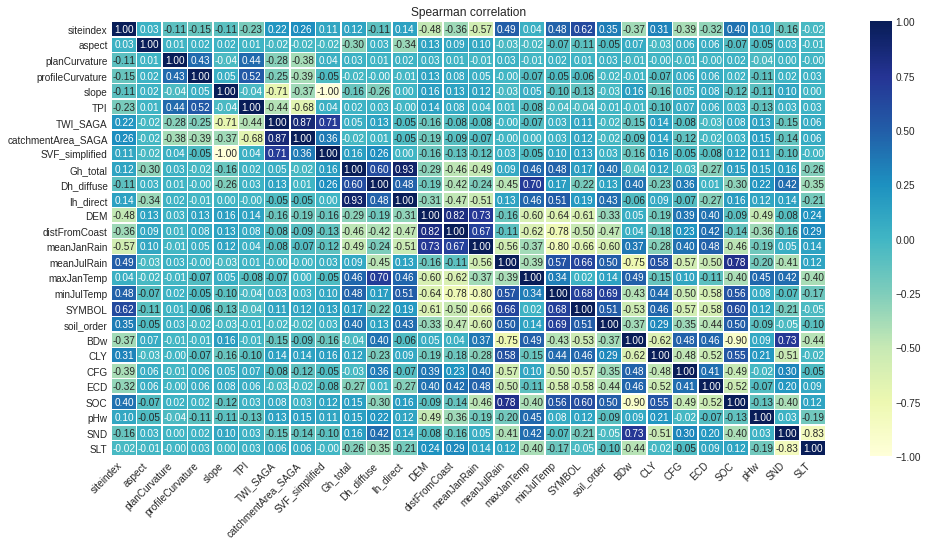

time: 20.2 s


In [ ]:
# 3.correlation with Spearman Improved
plt.style.use('seaborn-whitegrid')
plt.figure(figsize=(16,8))

corr_matrix = EDAsurveyCORR.corr(method="spearman")

sns.heatmap(corr_matrix, vmin=-1., vmax=1., annot=True, fmt='.2f', cmap="YlGnBu", cbar=True, linewidths=0.5)
plt.title("Spearman correlation")
#Rotate labels x-axis
plt.xticks(rotation=45, horizontalalignment='right')

plt.savefig('Spearmancorr_EDAsurvey.png', bbox_inches='tight', dpi=300)

## 2.2 Drop features high correlated

In [41]:
# Remove 4 columns: less feature importance
EDAsurvey.drop(columns=['catchmentArea_SAGA', 'SVF_simplified', 'Gh_total', 'distFromCoast'], inplace= True, axis = 1) 
#EDAsurvey.head()

#EDAsurvey.shape
#OUTPUT: (953556, 24)

# 3 Normalize Data

In [42]:
#NORMALIZE
from sklearn.preprocessing import MinMaxScaler

y = EDAsurveyCORR['siteindex']
EDAsurveyCORR = EDAsurveyCORR.loc[:, ~EDAsurveyCORR.columns.isin(['siteindex'])]

scaler = MinMaxScaler()
scaled_values = scaler.fit_transform(EDAsurveyCORR)
EDAsurveyCORR.loc[:,:] = scaled_values

EDAsurveyCORR['siteindex'] = y

In [43]:
EDAsurveyCORR.head(3)

,x,y,aspect,planCurvature,profileCurvature,slope,TPI,TWI_SAGA,catchmentArea_SAGA,SVF_simplified,Gh_total,Dh_diffuse,Ih_direct,DEM,distFromCoast,meanJanRain,meanJulRain,maxJanTemp,minJulTemp,SYMBOL,soil_order,BDw,CLY,CFG,ECD,SOC,pHw,SND,SLT,siteindex
0,0.626580,0.951884,0.324073,0.445431,0.637699,0.127219,0.524300,0.399242,0.005008,0.982469,0.982353,0.987201,0.974878,0.072357,0.095774,0.044092,0.184301,0.957136,0.932759,0.409137,0.730311,0.888483,0.236139,0.053705,0.355763,0.038044,0.561864,0.834947,0.185340,27.914452
1,0.626535,0.952226,0.271972,0.444238,0.618139,0.117983,0.521429,0.509997,0.015738,0.984659,0.984276,0.988226,0.976873,0.068866,0.095348,0.042475,0.183347,0.958660,0.934621,0.409137,0.730311,0.889869,0.247779,0.054667,0.368036,0.037626,0.600319,0.836997,0.175913,27.615402
2,0.626535,0.952397,0.278898,0.445406,0.610340,0.113273,0.521865,0.530687,0.019337,0.985892,0.983856,0.988683,0.976371,0.067856,0.095067,0.041899,0.182996,0.959172,0.935292,0.409137,0.730311,0.889948,0.248986,0.054729,0.368189,0.037598,0.602597,0.836463,0.175780,27.474239


## 3.1 Boxplot

In [44]:
# drop coordinates
EDAsurveyCORR.drop(columns=['x', 'y'], inplace= True, axis = 1) 

In [45]:
from sklearn import preprocessing
import numpy as np
# Get column names first
names = EDAsurveyCORR.columns

# Create the Scaler object
scaler2 = preprocessing.MinMaxScaler()

# Fit your data on the scaler object
EDAsurvey_normalize = scaler2.fit_transform(EDAsurveyCORR)
EDAsurvey_normalize = pd.DataFrame(EDAsurvey_normalize, columns=names)

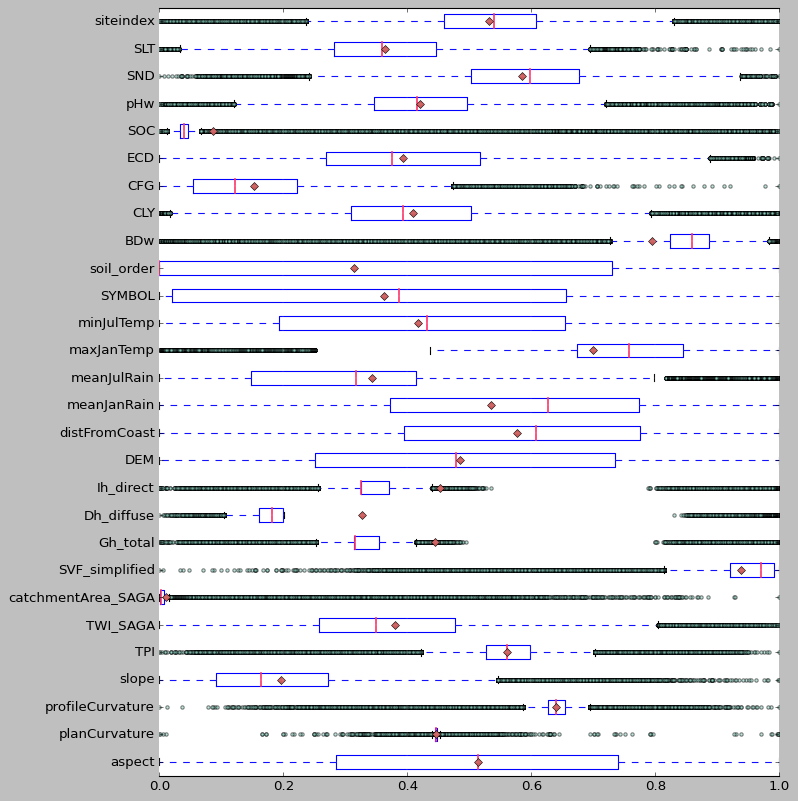

In [46]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
#sns.set_style("white")

plt.style.use('classic')

# Seaborn visualization library
medianprops = dict(linewidth=1.5, linestyle='-', color='#fc3468')
meanprops =  dict(marker='D', markerfacecolor='indianred', markersize=4.5)
flierprops = dict(marker='o', markerfacecolor='#7fcdbb', markersize=3, alpha=0.5)

box = EDAsurvey_normalize.boxplot(return_type='axes', figsize=(10,12), vert=False, medianprops=medianprops, 
                                  meanprops=meanprops, flierprops = flierprops,
                                  notch=False,  showmeans=True)
                           
# Show the grid lines as light grey lines
plt.grid(color='white', linestyle='-', linewidth=0.25, alpha=0.5)
plt.gca().spines['left'].set_color('none')
plt.gca().spines['right'].set_color('none')

plt.savefig('boxplot_EDAsurvey_norm.png', bbox_inches='tight', dpi=300)

## 3.2 Correlation between features

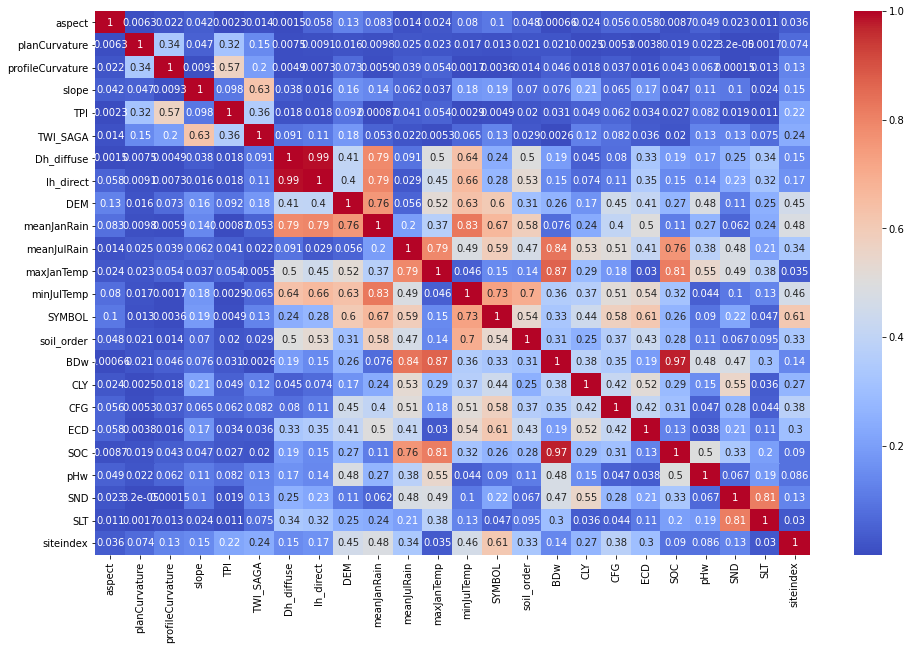

In [ ]:
#check correlation after drop 4 features
corr_matrix = EDAsurveyCORR.corr().abs()
plt.figure(figsize=(16,10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')

# III. LINEAR MODEL

# 1 Split into training: TEST=10%

In [64]:
# A_Target variable: Labels are the values we want to predict
X = EDAsurvey.drop('siteindex', axis = 1)

# Saving feature names for later use
X_list = list(EDAsurvey.columns)

# B_Independent variables: features are the values that help to predict
y = EDAsurvey['siteindex']#.values.reshape(-1,1)

# Using Skicit-learn to split data into training and testing sets
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.10, random_state=42)

print('Training Features Shape:', X_train.shape)
print('Training Labels Shape:', X_test.shape)
print('Testing Features Shape:', y_train.shape)
print('Testing Labels Shape:', y_test.shape)

Training Features Shape: (858200, 23)
Training Labels Shape: (95356, 23)
Testing Features Shape: (858200,)
Testing Labels Shape: (95356,)


In [49]:
EDAsurvey.head(3)

,x,y,siteindex,aspect,planCurvature,profileCurvature,slope,TPI,TWI_SAGA,Dh_diffuse,Ih_direct,DEM,meanJanRain,meanJulRain,maxJanTemp,minJulTemp,SYMBOL,soil_order,BDw,CLY,CFG,ECD,SOC,pHw,SND,SLT
0,508985,5452015,27.914452,58.561249,0.002594,0.000163,5.779576,-1.204296,8.033133,1.359027,7.344204,54.816718,4.617585,111.933050,24.504642,5.596159,29.526862,30.859531,1.018121,12.715149,1.777616,0.621924,3.254319,5.665130,75.630202,11.654650
1,508975,5452035,27.615402,49.200798,-0.007862,-0.001871,5.366687,-1.327446,9.179167,1.359776,7.359235,52.767088,4.569838,111.762547,24.511998,5.604992,29.526862,30.859531,1.019250,13.161926,1.803848,0.635599,3.237924,5.732380,75.776229,11.061845
2,508975,5452045,27.474239,50.445107,0.002370,-0.002682,5.156123,-1.308731,9.393249,1.360110,7.355454,52.174048,4.552800,111.699702,24.514470,5.608177,29.526862,30.859531,1.019314,13.208274,1.805538,0.635770,3.236828,5.736364,75.738196,11.053531


# 2 Extract index=idx for later merge with geography coord

## 2.1 Extracting train and test idx for later merge with geography coordinates

In [51]:
# Extracting train and test idx for later merge with additional data or geography coordinates
test_idx=np.asarray(X_test.index)
train_idx=np.asarray(X_train.index)

X_test_coord=EDAsurvey[[ 'x', 'y', 'siteindex']].iloc[test_idx]
X_test_coord.reset_index(inplace=True,drop=True)

X_train_coord=EDAsurvey[[ 'x', 'y', 'siteindex']].iloc[train_idx]
X_train_coord.reset_index(inplace=True,drop=True)

#test_idx

In [52]:
X_test.shape
#output: (95356, 25)

(95356, 25)

In [61]:
y_train.reset_index(drop=True,inplace=True)
y_test.reset_index(drop=True,inplace=True)

X_train.reset_index(drop=True,inplace=True)
X_test.reset_index(drop=True,inplace=True)

## 2.2 Drop coordinates

In [54]:
# drop coordinates
EDAsurvey.drop(columns=['x', 'y'], inplace= True, axis = 1) 

X_train.drop(columns=['x', 'y'], inplace= True, axis = 1) 
X_test.drop(columns=['x', 'y'], inplace= True, axis = 1) 

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [56]:
EDAsurvey.head(3)

,siteindex,aspect,planCurvature,profileCurvature,slope,TPI,TWI_SAGA,Dh_diffuse,Ih_direct,DEM,meanJanRain,meanJulRain,maxJanTemp,minJulTemp,SYMBOL,soil_order,BDw,CLY,CFG,ECD,SOC,pHw,SND,SLT
0,27.914452,58.561249,0.002594,0.000163,5.779576,-1.204296,8.033133,1.359027,7.344204,54.816718,4.617585,111.933050,24.504642,5.596159,29.526862,30.859531,1.018121,12.715149,1.777616,0.621924,3.254319,5.665130,75.630202,11.654650
1,27.615402,49.200798,-0.007862,-0.001871,5.366687,-1.327446,9.179167,1.359776,7.359235,52.767088,4.569838,111.762547,24.511998,5.604992,29.526862,30.859531,1.019250,13.161926,1.803848,0.635599,3.237924,5.732380,75.776229,11.061845
2,27.474239,50.445107,0.002370,-0.002682,5.156123,-1.308731,9.393249,1.360110,7.355454,52.174048,4.552800,111.699702,24.514470,5.608177,29.526862,30.859531,1.019314,13.208274,1.805538,0.635770,3.236828,5.736364,75.738196,11.053531


# 3 Fit: Linear Regression

## 3.1 Linear Regression Model | Ordinary Least Squares Method

In [65]:
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn import linear_model

# Create a linear regression object
model = linear_model.LinearRegression()

# TRAIN: Fit the model using the training set
model.fit(X_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

## 3.2 Predict Test Results

### 3.2.1 TEST: Make prediction using test set

In [67]:
# TEST: Make prediction using test set
predictedStand = model.predict(X_test)
predictedStand

array([28.41947183, 22.03111154, 30.06778409, ..., 33.63277791,
       22.25326299, 29.54614288])

In [79]:
dataTest = pd.DataFrame({'Actual': y_test, 'Predicted': predictedStand})
dataTest['residuals']=dataTest['Actual'] - dataTest['Predicted']
dataTest

,Actual,Predicted,residuals
553769,28.859368,28.419472,0.439896
204658,24.855434,22.031112,2.824322
50956,29.188636,30.067784,-0.879148
674976,33.722814,30.768645,2.954169
276007,26.763467,26.860703,-0.097236
...,...,...,...
436233,31.985134,28.139874,3.845260
237938,31.953531,25.937803,6.015728
926401,33.282146,33.632778,-0.350632
497222,24.566475,22.253263,2.313212


In [69]:
dataTest.describe()

,Actual,Predicted,residuals
count,95356.000000,95356.000000,95356.000000
mean,28.974028,28.963548,0.010480
std,5.381929,3.789607,3.852044
min,4.345072,18.554980,-29.714378
25%,25.586198,25.474939,-2.195452
50%,29.348133,29.667991,0.218664
75%,32.538016,31.793411,2.440209
max,50.989665,41.456976,22.388117


### 3.2.2 TRAIN: Make prediction using TRAIN set

In [70]:
# TRAIN: Make prediction using TRAIN set
y_train_predicted = model.predict(X_train)
y_train_predicted

array([22.13807656, 24.59771814, 31.93170337, ..., 30.54744022,
       29.80884506, 29.90692795])

In [71]:
dataTrain = pd.DataFrame({'Actual': y_train, 'Predicted': y_train_predicted})
dataTrain['residuals']=dataTrain['Actual'] - dataTrain['Predicted']
dataTrain

,Actual,Predicted,residuals
426806,20.748438,22.138077,-1.389639
271878,23.011154,24.597718,-1.586564
74289,35.330572,31.931703,3.398869
342262,20.046755,22.742109,-2.695354
412732,23.205501,24.529927,-1.324426
...,...,...,...
259178,31.022945,23.664384,7.358561
365838,19.096281,23.996406,-4.900125
131932,30.220222,30.547440,-0.327218
671155,32.565285,29.808845,2.756440


In [72]:
dataTrain.describe()

,Actual,Predicted,residuals
count,858200.000000,858200.000000,8.582000e+05
mean,28.962889,28.962889,-1.580499e-14
std,5.417805,3.799250,3.862422e+00
min,4.004133,18.222243,-3.161894e+01
25%,25.574180,25.453113,-2.215313e+00
50%,29.346779,29.679161,2.087102e-01
75%,32.533188,31.801745,2.455614e+00
max,50.989267,41.336836,2.736644e+01


### 3.2.3 Plot Predicted vs Observed | Test Set

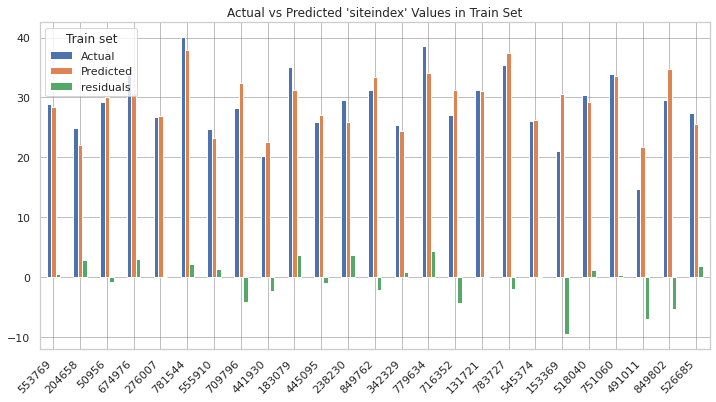

time: 1.33 s


In [ ]:
import numpy as np   # To perform calculations
import matplotlib.pyplot as plt  # To visualize data and regression line
from pylab import rcParams
import seaborn as sns

sns.set(style="whitegrid")

dfTest = dataTest.head(25)
dfTest.plot(kind='bar', figsize=(12,6))

#plt.legend(title="Train set",loc='upper center', bbox_to_anchor=(1.10, 0.8), frameon=False)
plt.legend(title="Train set", frameon=  True)
plt.title('Actual vs Predicted \'siteindex\' Values in Train Set' )
plt.grid(which='major', linestyle='-', linewidth='0.5', color='grey')
plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
plt.xticks(rotation=45, horizontalalignment='right')

plt.savefig('actualvsPredictedBar_LM_testSet.jpg', bbox_inches='tight', dpi=300)

### 3.2.4 Plot Goodness of fit for siteIndex values | Test set

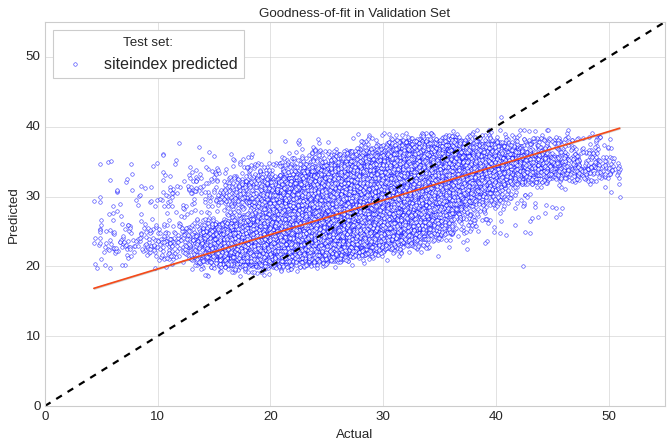

In [73]:

import matplotlib.pyplot as plt
import seaborn as sns
#sns.set(style='whitegrid')

plt.style.use('seaborn-whitegrid')

plt.figure(figsize=(10, 6))

ax = sns.regplot(x="Actual", y="Predicted", data=dataTest, label='siteindex predicted', scatter_kws = {'color': 'white', 'alpha': 0.8, 'edgecolor':'blue', 's':10}, line_kws = {'color': '#f54a19'})
ax.set_ylim(0,55)
ax.set_xlim(0,55)
ax.plot([0, 55], [0, 55], 'k--', lw=2)

ax.legend(title="Test set:", frameon=  True, loc='upper left')
#ax.legend(bbox_to_anchor =(0.85, -0.20), ncol = 4) 
plt.title('Goodness-of-fit in Validation Set',fontsize=12)

plt.savefig('actualvsPredicted_LM_testSet.jpg', bbox_inches='tight', dpi=300)

# 4 Perfomance and Validation

## 4.1 ACCURACY FOR TRAINING &TEST SET:

In [ ]:
# ACCURACY FOR TRAINING SET:
print("Accuracy on training set: {:.3f}".format(model.score(X_train, y_train)))

# ACCURACY FOR TEST SET:
print("Accuracy on test set: {:.3f}".format(model.score(X_test, y_test)))

Accuracy on training set: 0.492
Accuracy on test set: 0.488
time: 58.5 ms


In [ ]:
print("R2 (explained variance) Train Set: {:.3f}".format(metrics.r2_score(y_train, y_train_predicted), 2))
print("R2 (explained variance) Test set: {:.3f}".format(metrics.r2_score(y_test, predictedStand), 2))
print('MAE=Mean Absolute Error:', metrics.mean_absolute_error(y_test, predictedStand))  
print('MSE=Mean Squared Error:', metrics.mean_squared_error(y_test, predictedStand))  
print('RMSE=Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, predictedStand)))

R2 (explained variance) Train Set: 0.492
R2 (explained variance) Test set: 0.488
MAE=Mean Absolute Error: 2.9179711933888
MSE=Mean Squared Error: 14.838197540242849
RMSE=Root Mean Squared Error: 3.8520381021276062
time: 23.7 ms


In [ ]:
from math import sqrt
interval = 1.96 * sqrt( (0.488 * (1 - 0.488)) / 95356)
print('%.3f' % interval)

0.003
time: 2.36 ms


## 4.2 Calculate Squared Errror 

In [74]:
residSquare = np.square(dataTest['residuals'])
residSquare

553769     0.193509
204658     7.976797
50956      0.772901
674976     8.727114
276007     0.009455
            ...    
436233    14.786021
237938    36.188978
926401     0.122943
497222     5.350950
97942     14.612631
Name: residuals, Length: 95356, dtype: float64

### 4.2.1 Plot Squared Errror vs Observed 

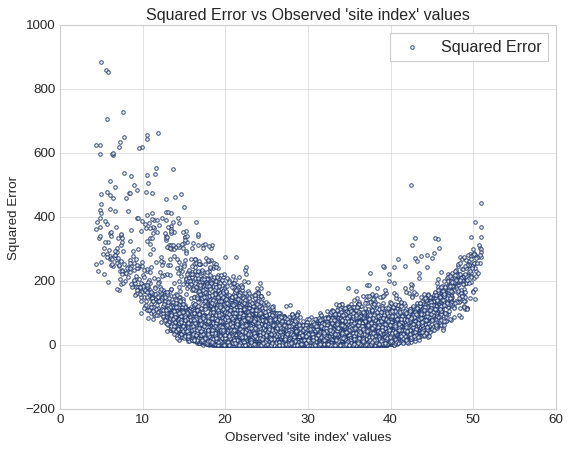

In [77]:
import matplotlib.pyplot as plt
plt.style.use('seaborn-whitegrid')
fig=plt.figure(figsize = [8, 6])

ax = fig.add_subplot(111)

ax.scatter(x=dataTest['Actual'], y=residSquare, label='Squared Error', c='white', alpha=0.8, edgecolors='#1b346c', s=10)
ax.set_xlabel("Observed 'site index' values") #it's a good idea to label your axes
ax.set_ylabel('Squared Error')



plt.title("Squared Error vs Observed 'site index' values")
plt.legend(title="",loc='upper right', frameon=True)
plt.savefig('SquaredError_LM.png', bbox_inches='tight', dpi=300)

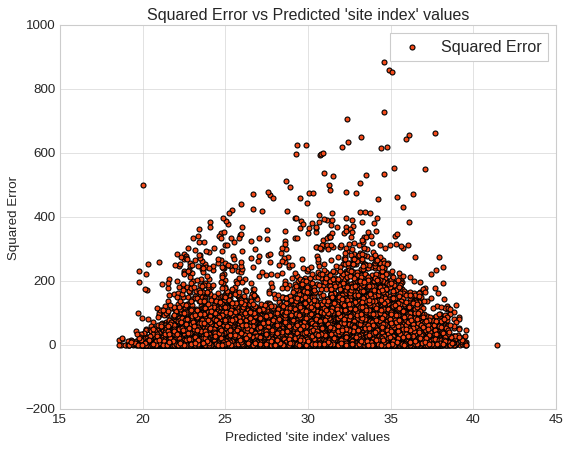

In [76]:
fig=plt.figure(figsize = [8, 6])

ax = fig.add_subplot(111)

ax.scatter(x=dataTest['Predicted'], y=residSquare, c='#f54a19', label='Squared Error')
ax.set_xlabel("Predicted 'site index' values") #it's a good idea to label your axes
ax.set_ylabel('Squared Error')

plt.title("Squared Error vs Predicted 'site index' values")
plt.legend(title="",loc='upper right', frameon=True)
plt.savefig('SquaredErrorPredicted_LM.png', bbox_inches='tight', dpi=300)

# 5 Evaluation: Slope of Coefficients

## 5.1 Model output

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score
# a. Intercept
print("Intercept:", model.intercept_)

# b. Coefficient - the slop of the line
print("Coefficients(slope of the line):", model.coef_)

# c. the error - the mean square error
print("Mean squared error: %.3f"% mean_squared_error(y_test,predictedStand))

# d. R-square -  how well x accout for the varaince of Y
print("R-square: %.3f'" % r2_score(y_test,predictedStand))

Intercept: 19.401481582155377
Coefficients(slope of the line): [ 1.38183732e-02 -1.30422771e+00  4.26298315e+00 -2.27674265e-02
 -3.59172419e-01  2.13293171e-01 -1.92313447e+01  5.23262989e-01
  1.22730732e-02 -4.36308922e-01  6.25894044e-03  1.67932249e+00
  1.29744011e+00  6.64703496e-01  9.42630301e-02 -3.27499505e+00
 -2.30506468e-01 -1.38554669e-02  3.85341056e+00 -1.37010272e-01
 -2.10926093e+00 -2.69362584e-01 -2.86902944e-01]
Mean squared error: 14.838
R-square: 0.488'
time: 12.1 ms


## 5.2 Build table to check model output

In [ ]:
#1.Run split into training
#y = EDAsurvey['siteindex'].values.reshape(-1,1)
#2. run model again

pred_model = pd.DataFrame(['aspect','planCurvature','profileCurvature','slope','TPI','TWI_SAGA','Dh_diffuse','Ih_direct','DEM','meanJanRain','meanJulRain','maxJanTemp','minJulTemp','SYMBOL','soil_order','BDw','CLY','CFG','ECD','SOC','pHw','SND','SLT'])
coeff = pd.DataFrame(model.coef_, index=['Co-efficient']).transpose() 

time: 3.61 ms


In [ ]:
pd.concat([pred_model,coeff], axis=1, join='inner')

,0,Co-efficient
0,aspect,0.013818
1,planCurvature,-1.304228
2,profileCurvature,4.262983
3,slope,-0.022767
4,TPI,-0.359172
5,TWI_SAGA,0.213293
6,Dh_diffuse,-19.231345
7,Ih_direct,0.523263
8,DEM,0.012273
9,meanJanRain,-0.436309


time: 13.7 ms


## 5.3 Plot Slopes

In [ ]:
column_names = ['aspect','planCurvature', 'profileCurvature','slope','TPI','TWI_SAGA','Dh_diffuse','Ih_direct','DEM','meanJanRain','meanJulRain','maxJanTemp','minJulTemp','SYMBOL','soil_order','BDw','CLY', 'CFG','ECD','SOC','pHw','SND','SLT']

regression_coefficient = pd.DataFrame({'Feature': column_names, 'Coefficient': model.coef_}, columns=['Feature', 'Coefficient'])

time: 5.39 ms


### 5.3.1 Display contribution of features towards dependent variable: 'siteindex' (y)

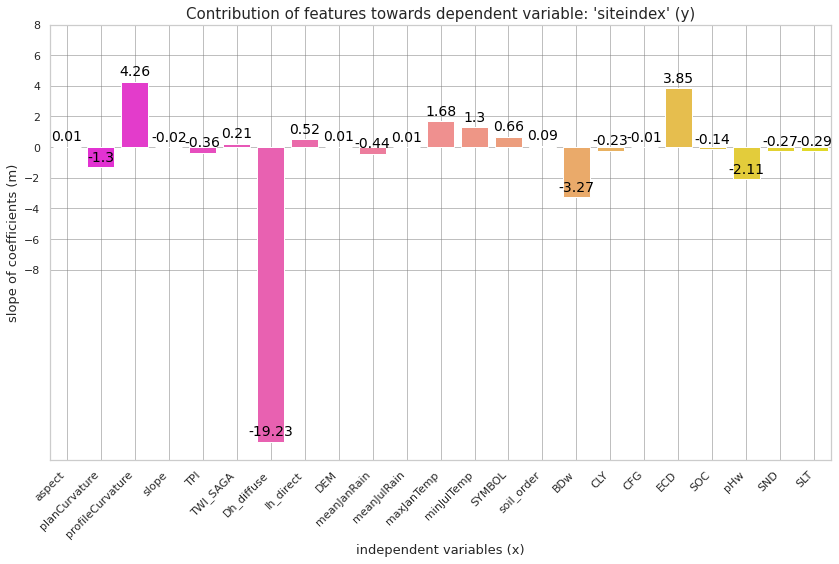

time: 2.2 s


In [ ]:
plt.figure(figsize=(14,8))
g = sns.barplot(x='Feature', y='Coefficient', data=regression_coefficient, capsize=0.3, palette='spring')
g.set_title("Contribution of features towards dependent variable: 'siteindex' (y)", fontsize=15)
g.set_xlabel("independent variables (x)", fontsize=13)
g.set_ylabel("slope of coefficients (m)", fontsize=13)
plt.xticks(rotation=45, horizontalalignment='right')
g.set_yticks([-8, -6, -4, -2, 0, 2, 4, 6, 8])
g.set_xticklabels(column_names)
for p in g.patches:
    g.annotate(np.round(p.get_height(),decimals=2), 
                (p.get_x()+p.get_width()/2., p.get_height()), 
                ha='center', va='center', xytext=(0, 10), 
               textcoords='offset points', fontsize=14, color='black')
    
plt.grid(which='major', linestyle='-', linewidth='0.5', color='grey')
#plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')


plt.savefig('FI_LM.png', bbox_inches='tight', dpi=300)

## 5.4 Mapping Predictions

In [ ]:
dataTrain_coord=pd.concat([dataTrain,X_train_coord], axis=1)
dataTrain_coord





,Actual,Predicted,residuals,x,y,siteindex
0,27.914452,30.231302,-2.316850,581415.0,5409105.0,20.748438
1,27.615402,30.353672,-2.738270,575335.0,5397765.0,23.011154
2,27.474239,30.391561,-2.917322,512905.0,5444675.0,35.330572
3,27.193528,30.178124,-2.984596,576865.0,5402885.0,20.046755
4,27.879600,30.153391,-2.273791,579255.0,5399115.0,23.205501
...,...,...,...,...,...,...
953551,32.349624,32.198022,0.151602,NaN,NaN,NaN
953552,30.811392,32.235525,-1.424133,NaN,NaN,NaN
953553,30.323318,32.302944,-1.979626,NaN,NaN,NaN
953554,31.950595,33.190233,-1.239638,NaN,NaN,NaN


In [ ]:
df_coord=pd.concat([dataTest,X_test_coord], axis=1)
df_coord

,Actual,Predicted,residuals,x,y,siteindex
0,NaN,NaN,NaN,586155.0,5404725.0,28.859368
1,NaN,NaN,NaN,579665.0,5397735.0,24.855434
2,NaN,NaN,NaN,511025.0,5446795.0,29.188636
3,NaN,NaN,NaN,386445.0,5435485.0,33.722814
4,NaN,NaN,NaN,575035.0,5398655.0,26.763467
...,...,...,...,...,...,...
953514,39.349241,36.037878,3.311363,NaN,NaN,NaN
953518,46.911415,35.576199,11.335216,NaN,NaN,NaN
953540,44.568615,34.153503,10.415112,NaN,NaN,NaN
953542,37.379526,34.181509,3.198017,NaN,NaN,NaN


time: 73.1 ms


### a) Convert to SHAPEFILE

In [ ]:
import geopandas as gpd
from pyproj import CRS

# create data-frame
grid_df_coord = df_coord[['Actual','Predicted','residuals','x','y','siteindex']]

# Convert to spatial point data-frame
grid_df_coord = gpd.GeoDataFrame(
    grid_df_coord, geometry=gpd.points_from_xy(grid_df_coord.x, grid_df_coord.y))

grid_df_coord.crs = CRS("EPSG:28355")
grid_df_coord.crs

#Save as ESRI shape file
from google.colab import files

grid_df_coord.to_file("ML_PRED_siteindex.shp")

time: 19.2 s


### b) Convert to raster

In [ ]:
# Input  point shape file
ml_point = 'ML_PRED_siteindex.shp'

time: 896 µs


In [ ]:
# Output raster
ml_output = 'ML_PRED_siteindex.tif'

time: 1.37 ms


In [ ]:
import gdal
from osgeo import ogr, gdal
from osgeo import gdalconst

# Reference raster
point_ndsm = 'fiveSiteIndex.tif'
point_data = gdal.Open(point_ndsm, gdalconst.GA_ReadOnly)

# Get geo-information
geo_transform = point_data.GetGeoTransform()
x_min = geo_transform[0]
y_max = geo_transform[3]
x_max = x_min + geo_transform[1] * point_data.RasterXSize
y_min = y_max + geo_transform[5] * point_data.RasterYSize
x_res = point_data.RasterXSize
y_res = point_data.RasterYSize
mb_v = ogr.Open(ml_point) # change 
mb_l = mb_v.GetLayer()
pixel_width = geo_transform[1]

# Raster coversion
target_ds = gdal.GetDriverByName('GTiff').Create(ml_output, x_res, y_res, 1, gdal.GDT_Float32) # Change
target_ds.SetGeoTransform((x_min, pixel_width, 0, y_min, 0, pixel_width))
band = target_ds.GetRasterBand(1)
band.FlushCache()
gdal.RasterizeLayer(target_ds, [1], mb_l, options=["ATTRIBUTE=Predicted"]) # Change 

target_ds = None

time: 2.58 s


### c) Plot Shapefile created

In [ ]:
 #Open GP=state polygon data 

import geopandas as gpd

fp_state="ML_PRED_siteindex.shp"

# read file using gpd.read_file()
ML_PRED_siteindex = gpd.read_file(fp_state) 
ML_PRED_siteindex.head()
#ML_PRED_siteindex= gpd.GeoDataFrame.from_file(fp_state)
#ML_PRED_siteindex.geom_type.head()

/usr/local/lib/python3.7/dist-packages/geopandas/_compat.py:110: UserWarning: The Shapely GEOS version (3.8.0-CAPI-1.13.1 ) is incompatible with the GEOS version PyGEOS was compiled with (3.9.0-CAPI-1.16.2). Conversions between both will be slow.
  shapely_geos_version, geos_capi_version_string


DriverError: ignored

In [ ]:
fp_state = ('/content/drive/My Drive/EDAsurvey_point/ML_PRED_siteindex')

import geopandas as gpd
# read file using gpd.read_file()
ML_PRED_siteindex = gpd.read_file(fp_state) 
ML_PRED_siteindex.head()

,Actual,Predicted,residuals,x,y,siteindex,geometry
0,NaN,NaN,NaN,586155.0,5404725.0,28.859368,POINT (586155.000 5404725.000)
1,NaN,NaN,NaN,579665.0,5397735.0,24.855434,POINT (579665.000 5397735.000)
2,NaN,NaN,NaN,511025.0,5446795.0,29.188636,POINT (511025.000 5446795.000)
3,NaN,NaN,NaN,386445.0,5435485.0,33.722814,POINT (386445.000 5435485.000)
4,NaN,NaN,NaN,575035.0,5398655.0,26.763467,POINT (575035.000 5398655.000)


In [ ]:
ML_PRED_siteindex.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 181057 entries, 0 to 181056
Data columns (total 7 columns):
 #   Column     Non-Null Count   Dtype   
---  ------     --------------   -----   
 0   Actual     95356 non-null   float64 
 1   Predicted  95356 non-null   float64 
 2   residuals  95356 non-null   float64 
 3   x          95356 non-null   float64 
 4   y          95356 non-null   float64 
 5   siteindex  95356 non-null   float64 
 6   geometry   181057 non-null  geometry
dtypes: float64(6), geometry(1)
memory usage: 9.7 MB


In [ ]:
fp_state = ('/content/drive/My Drive/EDAsurvey_point/EDAsurvey_point.shp')

import geopandas as gpd
# read file using gpd.read_file()
ML_PRED_siteindex = gpd.read_file(fp_state) 
ML_PRED_siteindex.head()

KeyboardInterrupt: ignored

In [ ]:
pip install esda

     |████████████████████████████████| 133kB 5.3MB/s 
ERROR: pysal 2.4.0 has requirement urllib3>=1.26, but you'll have urllib3 1.25.11 which is incompatible.
ERROR: datascience 0.10.6 has requirement folium==0.2.1, but you'll have folium 0.8.3 which is incompatible.
  Found existing installation: urllib3 1.26.3
    Uninstalling urllib3-1.26.3:
      Successfully uninstalled urllib3-1.26.3


In [ ]:
!pip install libpysal

In [ ]:
import libpysal
from libpysal.weights import Queen, Rook, KNN

# Generate W from the GeoDataFrame
w = libpysal.weights.Queen.from_dataframe(ML_PRED_siteindex, k=8)
# Row-standardization
# w.transform = 'R'

TypeError: ignored

In [ ]:
from esda.moran import Moran

w = Queen.from_dataframe(ML_PRED_siteondex)
moran = Moran(y, w)
moran.I

In [ ]:
from pyproj import CRS

# Defining projection: we assign the GDA94 / MGA zone 55 latitude-longitude CRS (EPSG:28355) to the crs attribute:
#state_BD.crs = CRS("EPSG:28355")
ML_PRED_siteindex.crs

<Projected CRS: EPSG:28355>
Name: GDA94 / MGA zone 55
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Australia - 144°E to 150°E
- bounds: (144.0, -50.89, 150.01, -9.23)
Coordinate Operation:
- name: Map Grid of Australia zone 55
- method: Transverse Mercator
Datum: Geocentric Datum of Australia 1994
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

time: 26 ms


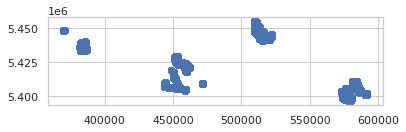

time: 6.8 s


In [ ]:
ML_PRED_siteindex.plot()

### d) Analysis Shapefile: Test set

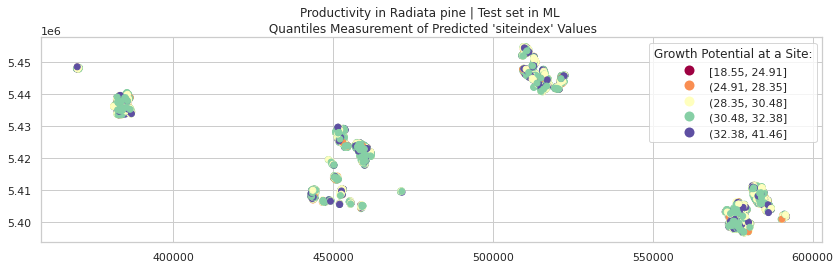

time: 26.3 s


In [ ]:
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, BoundaryNorm
from matplotlib import cm
from mpl_toolkits.axes_grid1 import make_axes_locatable
import mapclassify
# 2. MAP 2
fig, ax = plt.subplots(figsize=(14,12), subplot_kw={'aspect':'equal'})

ML_PRED_siteindex.plot(column="Predicted", scheme='Quantiles', k=5, cmap='Spectral', legend=True, legend_kwds={'title':'Growth Potential at a Site:'}, ax=ax)

# add a title for the plot
ax.set_title("Productivity in Radiata pine | Test set in ML \n Quantiles Measurement of Predicted 'siteindex' Values");

plt.savefig('pointsRadiataTas_Predicted.jpg', bbox_inches='tight', dpi=300)

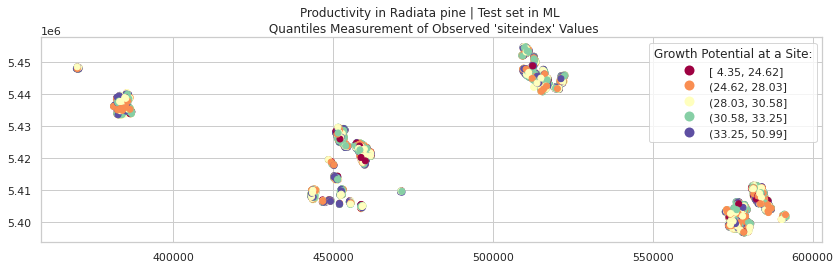

time: 25.3 s


In [ ]:
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, BoundaryNorm
from matplotlib import cm
from mpl_toolkits.axes_grid1 import make_axes_locatable
import mapclassify
# 2. MAP 2
fig, ax = plt.subplots(figsize=(14,12), subplot_kw={'aspect':'equal'})

ML_PRED_siteindex.plot(column="Actual", scheme='Quantiles', k=5, cmap='Spectral', legend=True, legend_kwds={'title':'Growth Potential at a Site:'}, ax=ax)

# add a title for the plot
ax.set_title("Productivity in Radiata pine | Test set in ML \n Quantiles Measurement of Observed 'siteindex' Values");

plt.savefig('pointsRadiataTas_Actual.jpg', bbox_inches='tight', dpi=300)

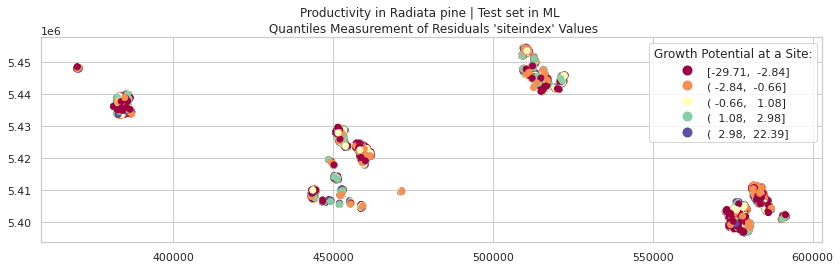

time: 25.3 s


In [ ]:
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, BoundaryNorm
from matplotlib import cm
from mpl_toolkits.axes_grid1 import make_axes_locatable
import mapclassify
# 2. MAP 2
fig, ax = plt.subplots(figsize=(14,12), subplot_kw={'aspect':'equal'})

ML_PRED_siteindex.plot(column="residuals", scheme='Quantiles', k=5, cmap='Spectral', legend=True, legend_kwds={'title':'Growth Potential at a Site:'}, ax=ax)

# add a title for the plot
ax.set_title("Productivity in Radiata pine | Test set in ML \n Quantiles Measurement of Residuals 'siteindex' Values");

plt.savefig('pointsRadiataTas_Residuals.jpg', bbox_inches='tight', dpi=300)

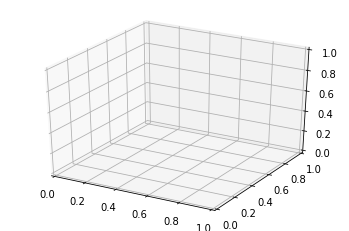

time: 188 ms


In [ ]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt

fig = plt.figure()
ax = plt.axes(projection='3d')

In [ ]:
import plotly.express as px

fig = px.scatter_3d(ML_PRED_siteindex, x='x', y='y', z=ML_PRED_siteindex.Predicted,
                    color=ML_PRED_siteindex.Predicted,
                    color_continuous_scale='hsv',
                    opacity=0.7)

# tight layout
fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))

fig.show()

time: 1.7 s


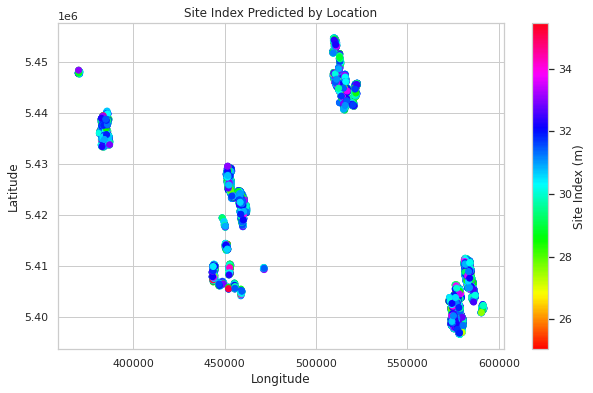

time: 3.17 s


In [ ]:
#fig, ax = plt.subplots(nrows=1, ncols=1,  sharex=False, sharey=False)
plt.figure(figsize=(10,6))
sns.set(style="whitegrid")
plt.scatter(ML_PRED_siteindex.x, ML_PRED_siteindex.y, c=ML_PRED_siteindex.Predicted, cmap='hsv')

#ax.set_xlabel('Longitude') #it's a good idea to label your axes
#ax.set_ylabel('Latitude')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

cbar= plt.colorbar()
cbar.set_label('Site Index (m)', labelpad=+1)

plt.title("Site Index Predicted by Location")
#plt.legend(title="Site Index (m)",loc='upper center', bbox_to_anchor=(1.15, 0.8), frameon=False)

plt.savefig('PredictedTestSet2D.png', bbox_inches='tight', dpi=300)


In [ ]:
from PIL import Image, ImageDraw

time: 2.3 ms


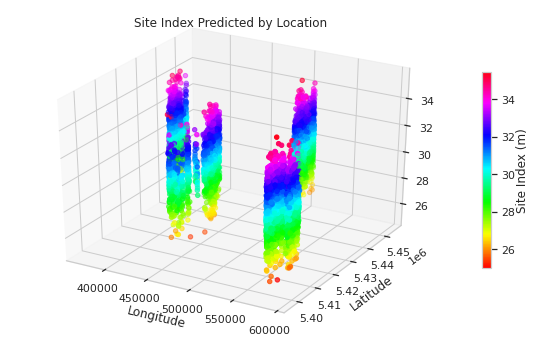

time: 1.67 s


In [ ]:
# library
import seaborn as sns

fig = plt.figure(figsize=(10,6))
ax = plt.axes(projection='3d')
sns.set(style="whitegrid")

# Data for a three-dimensional line
xline = ML_PRED_siteindex.x
yline = ML_PRED_siteindex.y
zline = ML_PRED_siteindex.Predicted

im = ax.scatter3D(xline, yline, zline, c= ML_PRED_siteindex.Predicted, cmap='hsv')

ax.set_xlabel('Longitude') #it's a good idea to label your axes
ax.set_ylabel('Latitude')

#cax = fig.add_axes([0.27, 0.8, 0.5, 0.05])

cbar= fig.colorbar(im, orientation='vertical', shrink=0.6)
cbar.set_label('Site Index (m)', labelpad=+1)

plt.title("Site Index Predicted by Location")
#plt.legend(title="Site Index (m)",loc='upper center', bbox_to_anchor=(1.15, 0.8), frameon=False)

plt.savefig('PredictedTestSet3D.png', bbox_inches='tight', dpi=300)

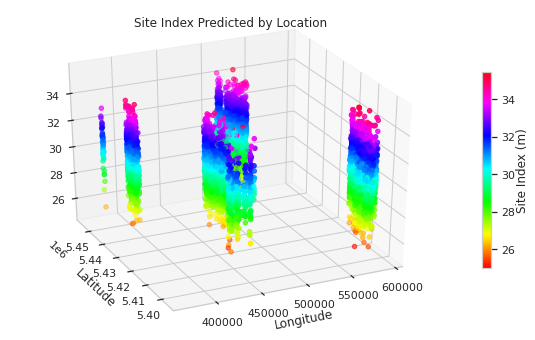

time: 410 ms


In [ ]:
import seaborn as sns

fig = plt.figure(figsize=(10,6))
ax = plt.axes(projection='3d')
sns.set(style="whitegrid")

# Data for a three-dimensional line
xline = ML_PRED_siteindex.x
yline = ML_PRED_siteindex.y
zline = ML_PRED_siteindex.Predicted

im = ax.scatter3D(xline, yline, zline, c= ML_PRED_siteindex.Predicted, cmap='hsv')

ax.set_xlabel('Longitude') #it's a good idea to label your axes
ax.set_ylabel('Latitude')

#cax = fig.add_axes([0.27, 0.8, 0.5, 0.05])

cbar= fig.colorbar(im, orientation='vertical', shrink=0.6)
cbar.set_label('Site Index (m)', labelpad=+1)

plt.title("Site Index Predicted by Location")
#plt.legend(title="Site Index (m)",loc='upper center', bbox_to_anchor=(1.15, 0.8), frameon=False)

# Rotate it
ax.view_init(30, 245)
plt.show()


(358927.5, 602852.5, 5393688.0, 5457642.0)

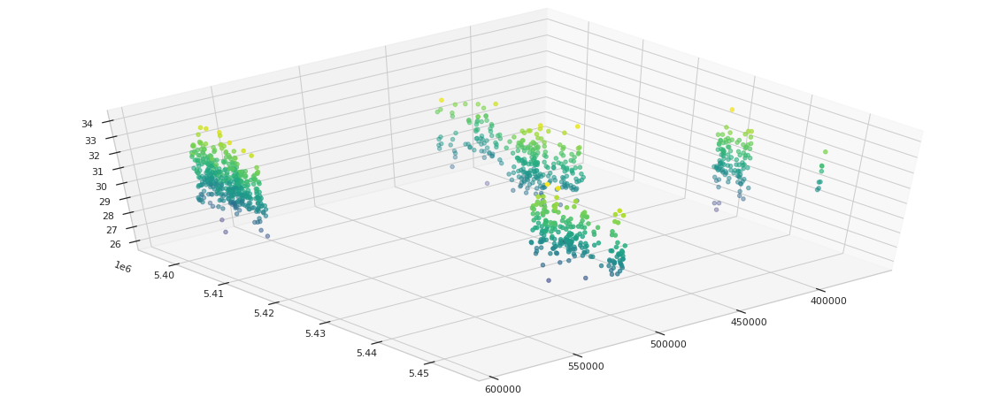

time: 332 ms


In [ ]:
fig = plt.figure(figsize=(20,8))

ax = fig.add_subplot(111, projection='3d')

ax.scatter(ML_PRED_siteindex.x[0:10000], ML_PRED_siteindex.y[0:10000], ML_PRED_siteindex.Predicted[0:10000], c= ML_PRED_siteindex.Predicted[0:10000], cmap='viridis')
ax.view_init(50, 50)

ax.axis('tight')

In [ ]:
#!pip install rasterio

### e) Plot raster: five site index

In [ ]:
#!pip install earthpy
import os
import earthpy as et
import earthpy.spatial as es
import earthpy.plot as ep

In [ ]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from rasterio.merge import merge
from rasterio.plot import show

dtm_path = rasterio.open('fiveSiteIndex.tif')

dtm_path.meta

{'count': 1,
 'crs': CRS.from_epsg(28355),
 'driver': 'GTiff',
 'dtype': 'float32',
 'height': 6201,
 'nodata': -99999.0,
 'transform': Affine(10.0, 0.0, 368495.0,
       0.0, -10.0, 5456505.0),
 'width': 22400}

In [ ]:
spatial_extent = rasterio.plot.plotting_extent(dtm_path)
spatial_extent

(368495.0, 592495.0, 5394495.0, 5456505.0)

Text(0.5, 1.0, 'Digital Elevation Model of Five Site Index for Analisis')

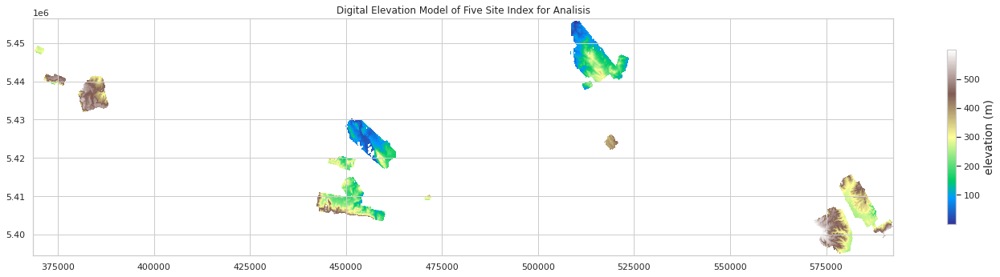

In [ ]:
import seaborn as sns
sns.set(style='whitegrid')

fig, ax = plt.subplots(figsize=(24,20))

im = ax.imshow(data_array, cmap='terrain', extent=spatial_extent)

cb = fig.colorbar(im, orientation='vertical', shrink=0.2)
cb.set_label('elevation (m)', fontsize= 14)
ax.set_title("Digital Elevation Model of Five Site Index for Analisis")

### f) Plot raster: ML_PRED_siteindex


In [ ]:
from osgeo import ogr, gdal
from osgeo import gdalconst
import numpy as np

filename = "ML_PRED_siteindex.tif"
gdal_data = gdal.Open(filename)
gdal_band = gdal_data.GetRasterBand(1)
nodataval = gdal_band.GetNoDataValue()

# convert to a numpy array
data_array = gdal_data.ReadAsArray().astype(np.float)
data_array

# replace missing values if necessary
if np.any(data_array == nodataval):
    data_array[data_array == nodataval] = np.nan
    data_array[data_array == nodataval] = np.nan
    
data_array[data_array < 0] = np.nan
data_array[data_array >= 600] = np.nan

Text(0.5, 1.0, 'Test set for Analisis')

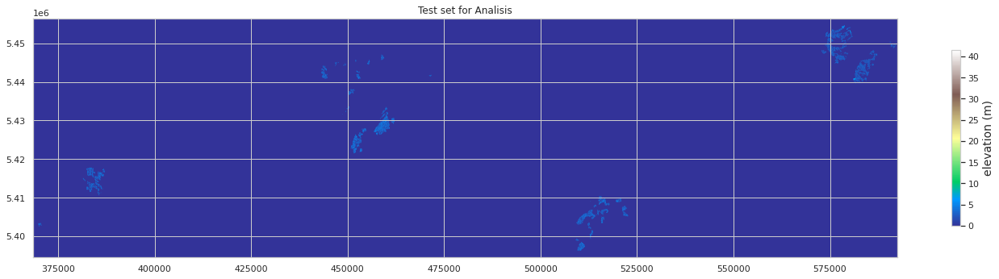

In [ ]:
import seaborn as sns
sns.set(style='whitegrid')

fig, ax = plt.subplots(figsize=(24,20))

im = ax.imshow(data_array, cmap='terrain', extent=spatial_extent)

cb = fig.colorbar(im, orientation='vertical', shrink=0.2)
cb.set_label('elevation (m)', fontsize= 14)
ax.set_title("Test set for Analisis")

In [ ]:
# outlier values in the data
print("the minimum raster value is: ", data_array.min())
print("the maximum raster value is: ", data_array.max())

the minimum raster value is:  0.0
the maximum raster value is:  41.45697784423828


## 5.5 Regression assumptions

In [ ]:
error = dataTest['Actual'] - dataTest['Predicted']
#error = y_test - predictedStand
#error_info = pd.DataFrame({'y_true': y_test, 'y_pred': predictedStand, 'error': error}, columns=['y_true', 'y_pred', 'error'])

error_info = pd.DataFrame({'y_true': dataTest['Actual'], 'y_pred': dataTest['Predicted'], 'error': error}, columns=['y_true', 'y_pred', 'error'])

time: 51.4 ms


/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
No handles with labels found to put in legend.


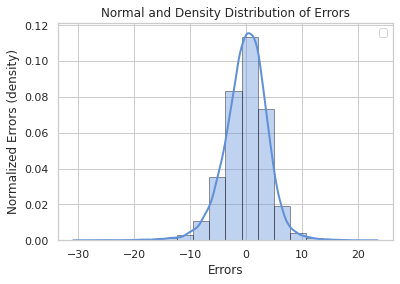

time: 1.32 s


In [ ]:
plt.figure(figsize = [6, 4]) # larger figure size for subplots

# Density Plot and Histogram of all A results
plt.subplot(1, 1, 1) # 1 row, 2 cols, subplot 1
sns.distplot(error_info.error, hist=True, kde=True, 
             bins=int(180/10), color = '#5f90d8', 
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 2})

# Plot formatting for  A
plt.legend()
plt.xlabel('Errors')
plt.ylabel('Normalized Errors (density)')
plt.title('Normal and Density Distribution of Errors')

plt.savefig('densityPlotHist.jpg', bbox_inches='tight', dpi=300)

In [ ]:
plus_one_std_dev = np.mean(error_info.error) + np.std(error_info.error)
minus_one_std_dev = np.mean(error_info.error) - np.std(error_info.error)

time: 3.21 ms


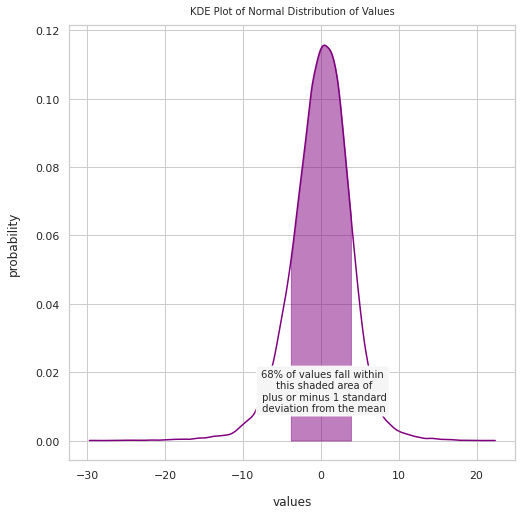

time: 2min 21s


In [ ]:
import pandas as pd
import seaborn as sns
import scipy.stats as stats
import warnings
import numpy as np
import matplotlib.pyplot as plt

plt.figure(figsize = [8, 8]) 

kde = stats.gaussian_kde(error_info.error)
pos = np.linspace(min(error_info.error), max(error_info.error), 50000)
plt.plot(pos, kde(pos), color='purple')
shade = np.linspace(minus_one_std_dev, plus_one_std_dev, 300)
plt.fill_between(shade, kde(shade), alpha=0.5, color='purple',)
plt.text(x=0.25, y=.0085, horizontalalignment='center', fontsize=10, 
         s="68% of values fall within\n this shaded area of\n plus or minus 1 standard\n deviation from the mean", 
         bbox=dict(facecolor='whitesmoke', boxstyle="round, pad=0.25"))
plt.title("KDE Plot of Normal Distribution of Values", fontsize=10, y=1.012)
plt.xlabel("values", labelpad=15)
plt.ylabel("probability", labelpad=15);

plt.savefig('kdePlot.jpg', bbox_inches='tight', dpi=300)

In [ ]:
std_dev = round(np.std(error_info.error), 1)
median = round(np.median(error_info.error), 1)

print("normal_distr_values has a median of {0} and a standard deviation of {1}".format(median, std_dev))

normal_distr_values has a median of 0.2 and a standard deviation of 3.9
time: 4.25 ms


In [ ]:
mean = round(np.mean(error_info.error), 1)
mean

0.0

time: 3.67 ms


In [ ]:
for number_deviations in [-3, -2, -1, 1, 2, 3]:
    value = round(np.mean(error_info.error) + number_deviations * np.std(error_info.error), 1)
    print("{0} is {1} standard deviations from the mean".format(value, number_deviations))

-11.5 is -3 standard deviations from the mean
-7.7 is -2 standard deviations from the mean
-3.8 is -1 standard deviations from the mean
3.9 is 1 standard deviations from the mean
7.7 is 2 standard deviations from the mean
11.6 is 3 standard deviations from the mean
time: 8.93 ms


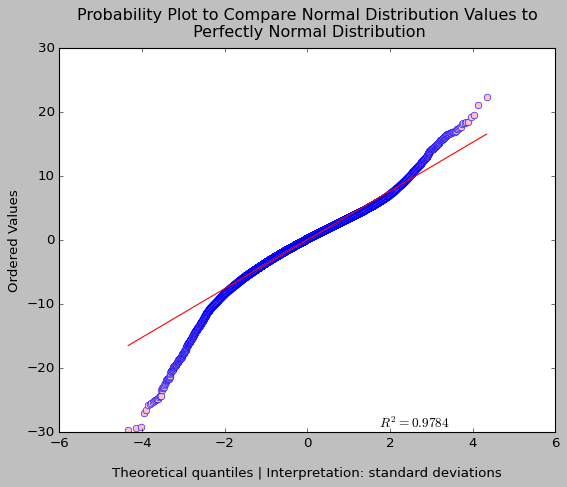

time: 1.78 s


In [ ]:
import pandas as pd
import seaborn as sns
import scipy.stats as stats
import warnings
import numpy as np
import matplotlib.pyplot as plt

plt.style.use('classic')

fig, ax = plt.subplots(1, 1)
x = stats.probplot(error_info.error, dist="norm", fit=True, rvalue=True, plot=plt)

ax.get_lines()[0].set_markerfacecolor('pink')
ax.get_lines()[0].set_markeredgecolor('blue')
ax.get_lines()[0].set_markersize(6)

plt.xlabel("Theoretical quantiles | Interpretation: standard deviations", labelpad=15)
plt.title("Probability Plot to Compare Normal Distribution Values to\n Perfectly Normal Distribution", y=1.015)

plt.savefig('probabilityPlot.jpg', bbox_inches='tight', dpi=300)

In [ ]:
#Shapiro-Wilk Test to test Normal Distribution (slow way)
w, pvalue = stats.shapiro(error_info.error)
print(w, pvalue)

0.9785346984863281 0.0
time: 15.7 ms


/usr/local/lib/python3.6/dist-packages/scipy/stats/morestats.py:1676: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


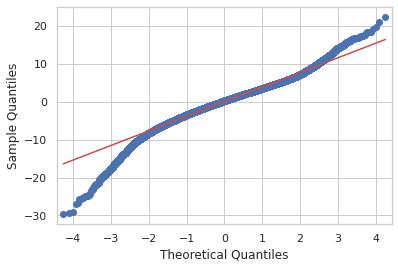

time: 460 ms


In [ ]:
#Normal Q-Q plot test Normal distribution
#From the above figure, we see that all data points lie to close to the 45-degree line 
#and hence we can conclude that it follows Normal Distribution.
res = error_info.error
fig = sm.qqplot(res, line='s')
plt.show()

In [ ]:
import scipy.stats as stats
stats.describe(error_info.error)

DescribeResult(nobs=95356, minmax=(-29.71437826275676, 22.388116736640207), mean=0.010480123194236406, variance=14.838243316171676, skewness=-0.43893020624921636, kurtosis=2.2440038049897923)

time: 15.2 ms


In [ ]:
t, pvalue = stats.ttest_1samp(error_info.error, 0.010480123194236406)
print(t, pvalue)

0.0 1.0
time: 7.43 ms


# 6 Fit Model: Linear model | K-fold Cross Validation

## 6.1. Model with 10-fold cross-validation with all features

### Option 1

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score
#lm = LinearRegression()

# 1. evaluate the model
scores10 = cross_val_score(model, X_train, y_train, cv=10, scoring='r2')
print("Cross-validation scores: {}".format(scores10))

Cross-validation scores: [0.49050153 0.48811549 0.49005627 0.49694692 0.49017649 0.49332354
 0.49024273 0.49106219 0.49086523 0.49599313]
time: 7.28 s


In [ ]:
# 2. report performance
print("Average cross-validation score: {:.3f}".format(scores10.mean()))
print('MAE: %.3f (%.3f)' % (mean(scores10), std(scores10)))
print("Accuracy: %0.3f (+/- %0.3f)" % (scores10.mean(), scores10.std()))

#The mean score and the 95% confidence interval of the score estimate are hence given by:
print("Accuracy for 95perc confidence interval: %0.3f (+/- %0.3f)" % (scores10.mean(), scores10.std() * 2))

Average cross-validation score: 0.492
MAE: 0.492 (0.003)
Accuracy: 0.492 (+/- 0.003)
Accuracy for 95perc confidence interval: 0.492 (+/- 0.005)
time: 3.44 ms


In [ ]:
# 2.1 Measure for boxplots
import statistics
from scipy import stats
# Median for predicted value
median = statistics.median(scores10)

q1, q2, q3= np.percentile(scores10,[25,50,75])
# IQR which is the difference between third and first quartile
iqr = q3 - q1

# lower_bound is 15.086 and upper bound is 43.249, so anything outside of 15.086 and 43.249 is an outlier.
lower_bound = q1 -(1.5 * iqr) 
upper_bound = q3 +(1.5 * iqr) 

print('upper_bound: %.3f' % upper_bound)
print('Third quartile (q3): %.3f' % q3)
print('Median: %.3f' % median)
print('First quartile (q1): %.3f' % q1)
#print('Median (q2): %.3f' % q2)
print('IQR: %.3f' % iqr)
print('lower_bound: %.3f' % lower_bound)

upper_bound: 0.497
Third quartile (q3): 0.493
Median: 0.491
First quartile (q1): 0.490
IQR: 0.003
lower_bound: 0.486
time: 7.92 ms


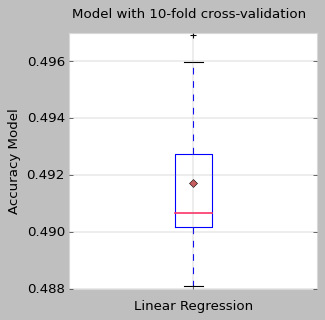

time: 402 ms


In [ ]:
# 3. plot performance
fig = plt.figure()
fig.suptitle('Model with 10-fold cross-validation')
ax = fig.add_subplot(111)
import matplotlib.pyplot as plt
plt.style.use('classic')

fig.set_size_inches(4, 4)

medianprops = dict(linewidth=1.5, linestyle='-', color='#fc3468')
meanprops =  dict(marker='D', markerfacecolor='indianred', markersize=4.5)

plt.gca().spines['right'].set_color('#D9D8D6')
plt.gca().spines['top'].set_color('#D9D8D6')
plt.gca().spines['left'].set_color('#D9D8D6')
plt.gca().spines['bottom'].set_color('#D9D8D6')

plt.grid(color='grey', linestyle='-', linewidth=0.25)

plt.boxplot(scores10, medianprops=medianprops, meanprops=meanprops, showmeans=True)
ax.set_xticklabels('')
plt.xlabel('Linear Regression')
plt.ylabel('Accuracy Model')

# Show the grid lines as light grey lines
#plt.grid(color='grey', linestyle='-', linewidth=0.25, alpha=0.5)

plt.savefig('accuracy_LM.png', bbox_inches='tight', dpi=300)

### Option 2

In [ ]:
from sklearn.model_selection import StratifiedKFold, KFold

# step-1: create a cross-validation scheme
folds = KFold(n_splits = 10, shuffle = True, random_state = 42)
#folds = StratifiedKFold(n_splits = 10, shuffle = True, random_state = 42)

time: 2.03 ms


In [ ]:
# step-2: specify range of hyperparameters to tune, consider all available #features
params = [{'n_features_to_select': list(range(1, len(X_list)+1))}]
params

[{'n_features_to_select': [1,
   2,
   3,
   4,
   5,
   6,
   7,
   8,
   9,
   10,
   11,
   12,
   13,
   14,
   15,
   16,
   17,
   18,
   19,
   20,
   21,
   22,
   23,
   24]}]

time: 3.21 ms


In [ ]:
from sklearn.feature_selection import RFE
# step-3: perform grid search
# 3.1 specify model
# Create a linear regression object
lm = linear_model.LinearRegression()
#lm = LinearRegression()

#lm.fit(X_train, y_train)
rfe = RFE(lm)

time: 2.92 ms


In [ ]:
from sklearn.model_selection import GridSearchCV

model_cv = GridSearchCV(estimator = rfe, param_grid = params, scoring= 'r2', cv = folds, verbose = 1, return_train_score=True)
model_cv

GridSearchCV(cv=KFold(n_splits=10, random_state=42, shuffle=True),
             error_score=nan,
             estimator=RFE(estimator=LinearRegression(copy_X=True,
                                                      fit_intercept=True,
                                                      n_jobs=None,
                                                      normalize=False),
                           n_features_to_select=None, step=1, verbose=0),
             iid='deprecated', n_jobs=None,
             param_grid=[{'n_features_to_select': [1, 2, 3, 4, 5, 6, 7, 8, 9,
                                                   10, 11, 12, 13, 14, 15, 16,
                                                   17, 18, 19, 20, 21, 22, 23,
                                                   24]}],
             pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
             scoring='r2', verbose=1)

time: 6.74 ms


In [ ]:
# fit the model KFold=10
model_cv.fit(X_train, y_train)

Fitting 10 folds for each of 24 candidates, totalling 240 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 240 out of 240 | elapsed: 22.8min finished


GridSearchCV(cv=KFold(n_splits=10, random_state=42, shuffle=True),
             error_score=nan,
             estimator=RFE(estimator=LinearRegression(copy_X=True,
                                                      fit_intercept=True,
                                                      n_jobs=None,
                                                      normalize=False),
                           n_features_to_select=None, step=1, verbose=0),
             iid='deprecated', n_jobs=None,
             param_grid=[{'n_features_to_select': [1, 2, 3, 4, 5, 6, 7, 8, 9,
                                                   10, 11, 12, 13, 14, 15, 16,
                                                   17, 18, 19, 20, 21, 22, 23,
                                                   24]}],
             pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
             scoring='r2', verbose=1)

time: 22min 50s


In [ ]:
# KFold=10
#ACCURACY FOR TRAINING SET:
print("Accuracy on training set: {:.3f}".format(model_cv.score(X_train, y_train)))
#ACCURACY FOR TEST SET:
print("Accuracy on test set:: {:.3f}".format(model_cv.score(X_test, y_test)))

Accuracy on training set: 0.492
Accuracy on test set:: 0.488
time: 139 ms


In [ ]:
# 4.1  Predicting the Test set results
y_pred = model_cv.predict(X_test)
y_pred

array([28.41947183, 22.03111154, 30.06778409, ..., 33.63277791,
       22.25326299, 29.54614288])

time: 23 ms


In [ ]:
# 4.1  Predicting the Test set results
y_pred = model_cv.predict(X_test)
y_pred

array([27.91941536, 21.53287815, 29.56794166, ..., 33.13248937,
       21.75364709, 29.04745103])

In [ ]:
#EVALUATE MODEL: R2 | KFold=10
print("R2 (explained variance): {:.3f}".format(metrics.r2_score(y_test, y_pred), 2))
print('MAE=Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))  
print('MSE=Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))  
print('RMSE=Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

R2 (explained variance): 0.488
MAE=Mean Absolute Error: 2.9179711933888
MSE=Mean Squared Error: 14.838197540242849
RMSE=Root Mean Squared Error: 3.8520381021276062
time: 11.8 ms


In [ ]:
!pip install rfpimp

     |████████████████████████████████| 163kB 1.9MB/s 
  Created wheel for rfpimp: filename=rfpimp-1.3.5-cp36-none-any.whl size=10261 sha256=31e9aed95644f26bd1817baf60a2f9a0ed4a3cde72caf77f0c225777589c8716
  Stored in directory: /root/.cache/pip/wheels/2a/c8/bf/80f91224be00870f84a85aa1782cf6cd62c1289a173b66b8e9
  Created wheel for stratx: filename=stratx-0.5-cp36-none-any.whl size=35033 sha256=49c1c8a47d05d60b2939b772e2f87694a451dcf25a903f19917c59214851e3ee
  Stored in directory: /root/.cache/pip/wheels/6e/28/de/a84563cfe761afd6c628e595590455412e26a6c4d587289d7b
Successfully built rfpimp stratx
time: 5.76 s


In [ ]:
from sklearn.metrics import r2_score
from rfpimp import permutation_importances

def r2(rf, X_train, y_train):
    return r2_score(y_train, model_cv.predict(X_train))

perm_imp_rfpimp = permutation_importances(model_cv, X_train, y_train, r2)

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.ensemble.forest module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.ensemble. Anything that cannot be imported from sklearn.ensemble is now part of the private API.
  warnings.warn(message, FutureWarning)
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Fitting 10 folds for each of 24 candidates, totalling 240 fits
time: 10.6 s


[Parallel(n_jobs=1)]: Done 240 out of 240 | elapsed:   10.5s finished


In [ ]:
perm_imp_rfpimp

,Importance
Feature,
Dh_diffuse,1.087308
meanJanRain,0.846532
SYMBOL,0.266728
SND,0.164416
DEM,0.117977
SLT,0.112868
CLY,0.087154
minJulTemp,0.083319
TPI,0.083064


time: 15.2 ms


## 6.2 Evaluating Linear Regression Models

In [ ]:
from sklearn.model_selection import cross_val_score

# function to get cross validation scores
def get_cv_scores(model):
    scores = cross_val_score(model,
                             X_train,
                             y_train,
                             cv=10,
                             scoring='r2')
    
    print('CV Mean: ', np.mean(scores))
    print('STD: ', np.std(scores))
    print('\n')

time: 2.83 ms


### 6.2.1 Linear Model | Ordinary Least Squares

In [ ]:
lm = LinearRegression()
# get cross val scores
get_cv_scores(lm)

CV Mean:  0.4917283532985216
STD:  0.0026669137238297335


time: 7.65 s


# 7 Fit Model: Linear Regresson |  Lasso

In [ ]:
from sklearn.linear_model import Lasso
# Train model with default alpha=1
lasso = Lasso(alpha=0.1).fit(X_train, y_train)
# get cross val scores
get_cv_scores(lasso)

CV Mean:  0.47570412588253247
STD:  0.00271599267871782


time: 1min 1s


In [ ]:
# find optimal alpha with grid search
alpha = [0.001, 0.01, 0.1, 1, 10, 100, 1000]
param_grid = dict(alpha=alpha)
grid = GridSearchCV(estimator=lasso, param_grid=param_grid, scoring='r2', verbose=1, n_jobs=-1)
grid_result = grid.fit(X_train, y_train)
print('Best Score: ', grid_result.best_score_)
print('Best Params: ', grid_result.best_params_)

Fitting 5 folds for each of 7 candidates, totalling 35 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  35 out of  35 | elapsed:  7.6min finished


Best Score:  0.49135457593591897
Best Params:  {'alpha': 0.001}
time: 8min 26s


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6204885.700631062, tolerance: 2519.0378299386025
  positive)


In [ ]:
from sklearn.linear_model import Lasso
# Train model with default alpha=1
lasso = Lasso(alpha=0.001, max_iter=100000).fit(X_train, y_train)
# get cross val scores
get_cv_scores(lasso)

CV Mean:  0.49138262888944795
STD:  0.002642309302822055


time: 33min 38s


In [ ]:
print("Training set score: {:.3f}".format(lasso.score(X_train, y_train)))
print("Test set score: {:.3f}".format(lasso.score(X_test, y_test)))
print("Number of features used: {}".format(np.sum(lasso.coef_!=0)))

Training set score: 0.491
Test set score: 0.487
Number of features used: 20
time: 66.8 ms


In [ ]:
# match column names to coefficients
for coef, col in enumerate(X_train.columns):
    print(f'{col}:  {lasso.coef_[coef]}')


aspect:  0.013343800390844365
planCurvature:  -0.8073201432642321
profileCurvature:  0.0
slope:  -0.015057273831074764
TPI:  -0.35047152901501144
TWI_SAGA:  0.21956984001226706
Dh_diffuse:  -14.311059492938403
Ih_direct:  0.34405206229625224
DEM:  0.007034867438795392
meanJanRain:  -0.43209835544296205
meanJulRain:  0.00044132445959307333
maxJanTemp:  0.6501595706258605
minJulTemp:  0.6520954162506464
SYMBOL:  0.6680411644310523
soil_order:  0.08381223694995166
BDw:  -0.0
CLY:  0.04720117911702886
CFG:  -0.010487763920016095
ECD:  3.8022248908212086
SOC:  -0.06995187527792708
pHw:  -2.0242531147320433
SND:  -0.0
SLT:  -0.012103086203203306
time: 2.7 ms


In [ ]:
y_pred = lasso.predict(X_test)
y_pred

array([28.38459646, 22.08332483, 30.27183959, ..., 33.67986818,
       22.28715119, 29.65751858])

time: 18.9 ms


In [ ]:
dataPred = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
dataPred

,Actual,Predicted
553769,28.859368,28.384596
204658,24.855434,22.083325
50956,29.188636,30.271840
674976,33.722814,30.682666
276007,26.763467,26.818350
...,...,...
436233,31.985134,28.113566
237938,31.953531,25.932798
926401,33.282146,33.679868
497222,24.566475,22.287151


time: 24.9 ms


In [ ]:
# TRAIN: Make prediction using TRAIN set
y_train_predicted = lasso.predict(X_train)
y_train_predicted

array([22.20865027, 24.61644083, 31.91524609, ..., 30.61778319,
       29.96213673, 29.76953417])

time: 47.1 ms


In [ ]:
dataTrain = pd.DataFrame({'Actual': y_train, 'Predicted': y_train_predicted})
dataTrain['residuals']=dataTrain['Actual'] - dataTrain['Predicted']
dataTrain

,Actual,Predicted,residuals
426806,20.748438,22.208650,-1.460212
271878,23.011154,24.616441,-1.605287
74289,35.330572,31.915246,3.415326
342262,20.046755,22.808247,-2.761492
412732,23.205501,24.542423,-1.336922
...,...,...,...
259178,31.022945,23.690791,7.332154
365838,19.096281,24.043369,-4.947088
131932,30.220222,30.617783,-0.397561
671155,32.565285,29.962137,2.603148


time: 31.4 ms


In [ ]:
#EVALUATE MODEL: R2 | 
print("R2 (explained variance) Train Set: {:.3f}".format(metrics.r2_score(y_train, y_train_predicted), 2))
print("R2 (explained variance) Test set: {:.3f}".format(metrics.r2_score(y_test, y_pred), 2))
print('MAE=Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))  
print('MSE=Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))  
print('RMSE=Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

R2 (explained variance) Train Set: 0.491
R2 (explained variance) Test set: 0.487
MAE=Mean Absolute Error: 2.919342540310864
MSE=Mean Squared Error: 14.8474169328974
RMSE=Root Mean Squared Error: 3.8532346065218244
time: 23.4 ms


In [ ]:
column_names = ['aspect','planCurvature', 'profileCurvature','slope','TPI','TWI_SAGA','Dh_diffuse','Ih_direct','DEM','meanJanRain','meanJulRain','maxJanTemp','minJulTemp','SYMBOL','soil_order','BDw','CLY', 'CFG','ECD','SOC','pHw','SND','SLT']

regression_coefficient = pd.DataFrame({'Feature': column_names, 'Coefficient': lasso.coef_}, columns=['Feature', 'Coefficient'])

time: 5.09 ms


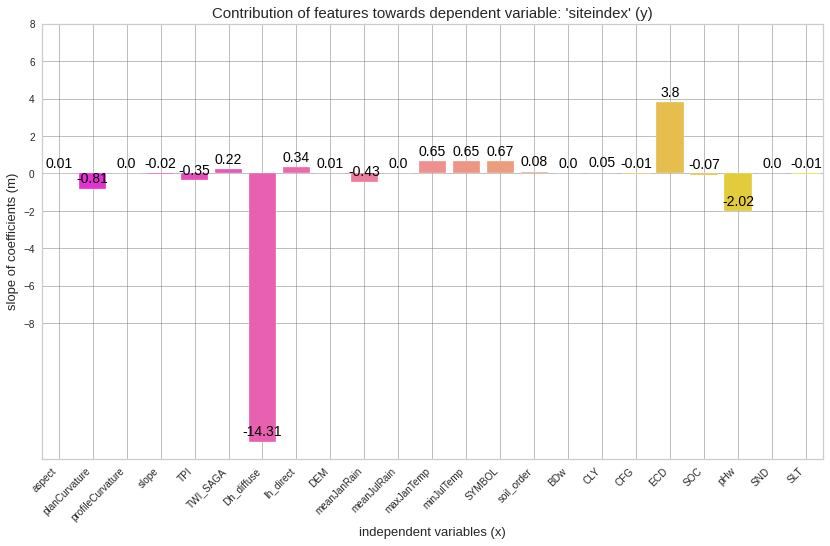

time: 2.23 s


In [ ]:
plt.figure(figsize=(14,8))
g = sns.barplot(x='Feature', y='Coefficient', data=regression_coefficient, capsize=0.3, palette='spring')
g.set_title("Contribution of features towards dependent variable: 'siteindex' (y)", fontsize=15)
g.set_xlabel("independent variables (x)", fontsize=13)
g.set_ylabel("slope of coefficients (m)", fontsize=13)
plt.xticks(rotation=45, horizontalalignment='right')
g.set_yticks([-8, -6, -4, -2, 0, 2, 4, 6, 8])
g.set_xticklabels(column_names)
for p in g.patches:
    g.annotate(np.round(p.get_height(),decimals=2), 
                (p.get_x()+p.get_width()/2., p.get_height()), 
                ha='center', va='center', xytext=(0, 10), 
               textcoords='offset points', fontsize=14, color='black')
    
plt.grid(which='major', linestyle='-', linewidth='0.5', color='grey')
#plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')


plt.savefig('regCoef_lassoModel_10test.png', bbox_inches='tight', dpi=300)

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score
# Model Output
# a. Intercept
print("Intercept:", lasso.intercept_)

# b. Coefficient - the slop of the line
print("Coefficients(slope of the line):", lasso.coef_)

# c. the error - the mean square error
print("Mean squared error: %.3f"% mean_squared_error(y_test,y_pred))

# d. R-square -  how well x accout for the varaince of Y
print("R-square: %.3f'" % r2_score(y_test,y_pred))

Intercept: 13.00214555825951
Coefficients(slope of the line): [ 1.33438004e-02 -8.07320143e-01  0.00000000e+00 -1.50572738e-02
 -3.50471529e-01  2.19569840e-01 -1.43110595e+01  3.44052062e-01
  7.03486744e-03 -4.32098355e-01  4.41324460e-04  6.50159571e-01
  6.52095416e-01  6.68041164e-01  8.38122369e-02 -0.00000000e+00
  4.72011791e-02 -1.04877639e-02  3.80222489e+00 -6.99518753e-02
 -2.02425311e+00 -0.00000000e+00 -1.21030862e-02]
Mean squared error: 14.847
R-square: 0.487'
time: 13.2 ms


# 8 Fit Model Linear Reg | Normalize

In [ ]:
from sklearn import preprocessing
# Get column names first
names = EDAsurvey.columns

# Create the Scaler object
scaler2 = preprocessing.MinMaxScaler()

# Fit your data on the scaler object
EDAsurvey_norm = scaler2.fit_transform(EDAsurvey)
EDAsurvey_norm = pd.DataFrame(EDAsurvey_norm, columns=names) 
EDAsurvey_norm

,siteindex,aspect,planCurvature,profileCurvature,slope,TPI,TWI_SAGA,Dh_diffuse,Ih_direct,DEM,meanJanRain,meanJulRain,maxJanTemp,minJulTemp,SYMBOL,soil_order,BDw,CLY,CFG,ECD,SOC,pHw,SND,SLT
0,0.508887,0.324073,0.445431,0.637699,0.127219,0.524300,0.399242,0.987201,0.974878,0.072357,0.044092,0.184301,0.957136,0.932759,0.409137,0.730311,0.888483,0.236139,0.053705,0.355763,0.038044,0.561864,0.834947,0.185340
1,0.502522,0.271972,0.444238,0.618139,0.117983,0.521429,0.509997,0.988226,0.976873,0.068866,0.042475,0.183347,0.958660,0.934621,0.409137,0.730311,0.889869,0.247779,0.054667,0.368036,0.037626,0.600319,0.836997,0.175913
2,0.499518,0.278898,0.445406,0.610340,0.113273,0.521865,0.530687,0.988683,0.976371,0.067856,0.041899,0.182996,0.959172,0.935292,0.409137,0.730311,0.889948,0.248986,0.054729,0.368189,0.037598,0.602597,0.836463,0.175780
3,0.493543,0.353328,0.445932,0.620043,0.135483,0.523819,0.335656,0.986266,0.973560,0.074708,0.045347,0.185025,0.955888,0.931355,0.409137,0.730311,0.887536,0.228323,0.052748,0.346148,0.038323,0.534801,0.831176,0.194383
4,0.508145,0.336173,0.445418,0.630900,0.131019,0.524329,0.353325,0.986734,0.974377,0.073859,0.044639,0.184609,0.956542,0.932158,0.409137,0.730311,0.887934,0.237401,0.053405,0.345124,0.038164,0.547753,0.827193,0.193354
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
953551,0.603281,0.103463,0.447287,0.632121,0.070406,0.565961,0.337403,0.169702,0.344538,0.272723,0.416839,0.483054,0.684696,0.440776,0.597105,1.000000,0.810130,0.507378,0.095819,0.408782,0.045925,0.443636,0.448965,0.457039
953552,0.570543,0.121357,0.446239,0.636650,0.065643,0.567914,0.336690,0.169852,0.342407,0.271856,0.416117,0.482040,0.685687,0.441539,0.597105,1.000000,0.811148,0.498837,0.089284,0.411417,0.046099,0.442786,0.454555,0.455921
953553,0.560155,0.155459,0.446176,0.643565,0.067712,0.570728,0.341583,0.169848,0.341840,0.271065,0.415395,0.481026,0.686679,0.442302,0.597105,1.000000,0.811705,0.493422,0.081891,0.412303,0.046238,0.441827,0.458084,0.455228
953554,0.594789,0.270318,0.456329,0.665077,0.069068,0.532458,0.435607,0.168232,0.337684,0.299096,0.427227,0.498327,0.670395,0.428608,0.597105,1.000000,0.805693,0.587964,0.152839,0.405902,0.044471,0.461099,0.417497,0.443498


time: 321 ms


In [ ]:
# A_Target variable: Labels are the values we want to predict
X = EDAsurvey_norm.drop('siteindex', axis = 1)

# B_Independent variables: features are the values that help to predict
y = EDAsurvey_norm['siteindex']#.values.reshape(-1,1)

# Using Skicit-learn to split data into training and testing sets
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.10, random_state=42)

print('Training Features Shape:', X_train.shape)
print('Training Labels Shape:', X_test.shape)
print('Testing Features Shape:', y_train.shape)
print('Testing Labels Shape:', y_test.shape)

Training Features Shape: (858200, 23)
Training Labels Shape: (95356, 23)
Testing Features Shape: (858200,)
Testing Labels Shape: (95356,)
time: 433 ms


In [ ]:
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn import linear_model

# Create a linear regression object
modelNorm = linear_model.LinearRegression()

# TRAIN: Fit the model using the training set
modelNorm.fit(X_train, y_train)

# TEST: Make prediction using test set
predictedNorm = modelNorm.predict(X_test)
predictedNorm

array([0.51963525, 0.38367084, 0.55471653, ..., 0.63059081, 0.38839892,
       0.54361436])

time: 860 ms


In [ ]:
y_train_predictedNorm = lasso.predict(X_train)
y_train_predictedNorm

array([11.500371  , 11.11951595,  0.96969409, ...,  0.63519515,
       12.69042878,  0.53993299])

time: 51.7 ms


In [ ]:
from sklearn.metrics import mean_squared_error, r2_score
# Model Output
# a. Intercept
print("Intercept:", model.intercept_)

# b. Coefficient - the slop of the line
print("Coefficients(slope of the line):", model.coef_)

# c. the error - the mean square error
print("Mean squared error: %.3f"% mean_squared_error(y_test,predictedNorm))

# d. R-square -  how well x accout for the varaince of Y
print("R-square: %.3f'" % r2_score(y_test,predictedNorm))

Intercept: 19.401481582155377
Coefficients(slope of the line): [ 1.38183732e-02 -1.30422771e+00  4.26298315e+00 -2.27674265e-02
 -3.59172419e-01  2.13293171e-01 -1.92313447e+01  5.23262989e-01
  1.22730732e-02 -4.36308922e-01  6.25894044e-03  1.67932249e+00
  1.29744011e+00  6.64703496e-01  9.42630301e-02 -3.27499505e+00
 -2.30506468e-01 -1.38554669e-02  3.85341056e+00 -1.37010272e-01
 -2.10926093e+00 -2.69362584e-01 -2.86902944e-01]
Mean squared error: 0.007
R-square: 0.488'
time: 10.3 ms


In [ ]:
#ACCURACY FOR TRAINING SET:
print("Accuracy on training set: {:.3f}".format(modelNorm.score(X_train, y_train)))
#ACCURACY FOR TEST SET:
print("Accuracy on test set:: {:.3f}".format(modelNorm.score(X_test, y_test)))

Accuracy on training set: 0.492
Accuracy on test set:: 0.488
time: 59.9 ms


In [ ]:
#EVALUATE MODEL: R2
print("R2 (explained variance): {:.3f}".format(metrics.r2_score(y_test, predictedNorm), 2))
print('MAE=Mean Absolute Error:', metrics.mean_absolute_error(y_test, predictedNorm))  
print('MSE=Mean Squared Error:', metrics.mean_squared_error(y_test, predictedNorm))  
print('RMSE=Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, predictedNorm)))

R2 (explained variance): 0.488
MAE=Mean Absolute Error: 0.062103610817661956
MSE=Mean Squared Error: 0.006721293362844966
RMSE=Root Mean Squared Error: 0.08198349445373114
time: 15.8 ms


In [ ]:
column_names = ['aspect','planCurvature', 'profileCurvature','slope','TPI','TWI_SAGA','Dh_diffuse','Ih_direct','DEM','meanJanRain','meanJulRain','maxJanTemp','minJulTemp','SYMBOL','soil_order','BDw','CLY', 'CFG','ECD','SOC','pHw','SND','SLT']

regression_coefficient = pd.DataFrame({'Feature': column_names, 'Coefficient': modelNorm.coef_}, columns=['Feature', 'Coefficient'])

time: 3.99 ms


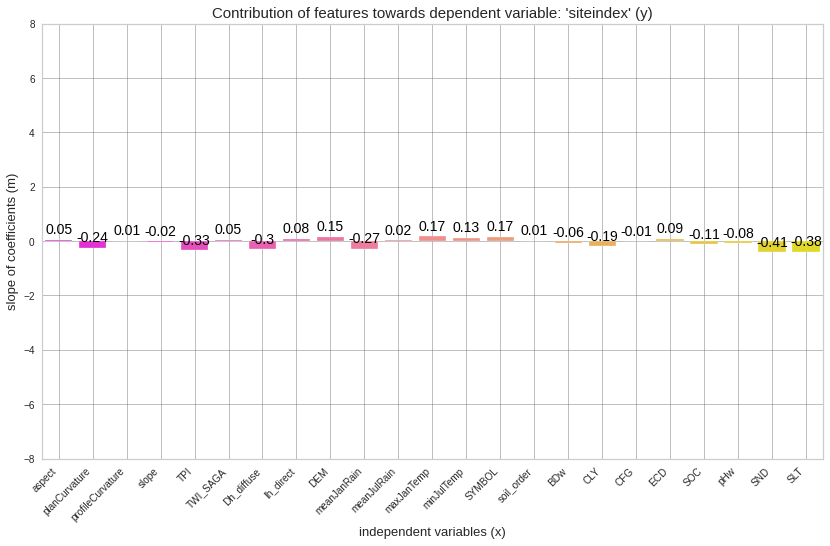

time: 2.2 s


In [ ]:
plt.figure(figsize=(14,8))
g = sns.barplot(x='Feature', y='Coefficient', data=regression_coefficient, capsize=0.3, palette='spring')
g.set_title("Contribution of features towards dependent variable: 'siteindex' (y)", fontsize=15)
g.set_xlabel("independent variables (x)", fontsize=13)
g.set_ylabel("slope of coefficients (m)", fontsize=13)
plt.xticks(rotation=45, horizontalalignment='right')
g.set_yticks([-8, -6, -4, -2, 0, 2, 4, 6, 8])
g.set_xticklabels(column_names)
for p in g.patches:
    g.annotate(np.round(p.get_height(),decimals=2), 
                (p.get_x()+p.get_width()/2., p.get_height()), 
                ha='center', va='center', xytext=(0, 10), 
               textcoords='offset points', fontsize=14, color='black')
    
plt.grid(which='major', linestyle='-', linewidth='0.5', color='grey')
#plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')


plt.savefig('regCoef_linearModel_Norm.png', bbox_inches='tight', dpi=300)

# SPATIAL AUTOCORRELATION

## dataTrain

In [ ]:
dataTrain_coord_point = gpd.GeoDataFrame(dataTrain_coord, geometry=gpd.points_from_xy(dataTrain_coord.x, dataTrain_coord.y))

In [ ]:
dataTrain_coord

,Actual,Predicted,residuals,x,y,siteindex,geometry
0,27.914452,30.231302,-2.316850,581415.0,5409105.0,20.748438,POINT (581415.000 5409105.000)
1,27.615402,30.353672,-2.738270,575335.0,5397765.0,23.011154,POINT (575335.000 5397765.000)
2,27.474239,30.391561,-2.917322,512905.0,5444675.0,35.330572,POINT (512905.000 5444675.000)
3,27.193528,30.178124,-2.984596,576865.0,5402885.0,20.046755,POINT (576865.000 5402885.000)
4,27.879600,30.153391,-2.273791,579255.0,5399115.0,23.205501,POINT (579255.000 5399115.000)
...,...,...,...,...,...,...,...
953551,32.349624,32.198022,0.151602,NaN,NaN,NaN,POINT (nan nan)
953552,30.811392,32.235525,-1.424133,NaN,NaN,NaN,POINT (nan nan)
953553,30.323318,32.302944,-1.979626,NaN,NaN,NaN,POINT (nan nan)
953554,31.950595,33.190233,-1.239638,NaN,NaN,NaN,POINT (nan nan)


In [ ]:
dataTrain_coord_point.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 943983 entries, 0 to 953555
Data columns (total 7 columns):
 #   Column     Non-Null Count   Dtype   
---  ------     --------------   -----   
 0   Actual     858200 non-null  float64 
 1   Predicted  858200 non-null  float64 
 2   residuals  858200 non-null  float64 
 3   x          858200 non-null  float64 
 4   y          858200 non-null  float64 
 5   siteindex  858200 non-null  float64 
 6   geometry   943983 non-null  geometry
dtypes: float64(6), geometry(1)
memory usage: 57.6 MB


In [ ]:
dataTrain_coord_point.dropna(inplace=True)

In [ ]:
dataTrain_coord_point

,Actual,Predicted,residuals,x,y,siteindex,geometry
0,27.914452,30.231302,-2.316850,581415.0,5409105.0,20.748438,POINT (581415.000 5409105.000)
1,27.615402,30.353672,-2.738270,575335.0,5397765.0,23.011154,POINT (575335.000 5397765.000)
2,27.474239,30.391561,-2.917322,512905.0,5444675.0,35.330572,POINT (512905.000 5444675.000)
3,27.193528,30.178124,-2.984596,576865.0,5402885.0,20.046755,POINT (576865.000 5402885.000)
4,27.879600,30.153391,-2.273791,579255.0,5399115.0,23.205501,POINT (579255.000 5399115.000)
...,...,...,...,...,...,...,...
858194,33.517307,31.625278,1.892029,385155.0,5437405.0,28.720292,POINT (385155.000 5437405.000)
858195,31.509226,31.615017,-0.105791,574515.0,5400905.0,31.022945,POINT (574515.000 5400905.000)
858196,30.850184,31.580852,-0.730668,577015.0,5404635.0,19.096281,POINT (577015.000 5404635.000)
858197,33.040827,31.551703,1.489124,515955.0,5447675.0,30.220222,POINT (515955.000 5447675.000)


In [ ]:
# spatial weights matrix. We will use nearest neighbors 
w = weights.contiguity.Queen.from_dataframe(dataTrain_coord_point)
# w.neighbors

In [ ]:
# Row-standardization THE WEIGHTS
w.transform = 'R'

In [ ]:
# calculate the spatial lag of our variable of interest:
dataTrain_coord_point['w_Actual'] = weights.spatial_lag.lag_spatial(w, dataTrain_coord_point['Actual'])

In [ ]:
# the variable of interest is usually standardized by substracting its mean and dividing it by its standard deviation:
dataTrain_coord_point['Actual_std'] = ( dataTrain_coord_point['Actual'] - dataTrain_coord_point['Actual'].mean() )\
                    / dataTrain_coord_point['Actual'].std()

dataTrain_coord_point['w_Actual_std'] = ( dataTrain_coord_point['w_Actual'] - dataTrain_coord_point['w_Actual'].mean() )\
                    / dataTrain_coord_point['w_Actual'].std()

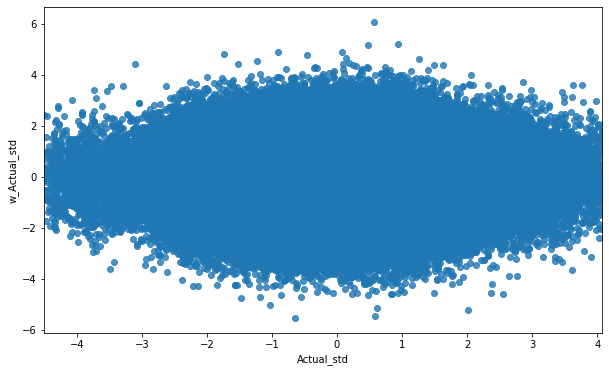

In [ ]:
# creating a Moran Plot

# Setup the figure and axis
f, ax = plt.subplots(1, figsize=(10, 6))
# Plot values
seaborn.regplot(x='Actual_std', y='w_Actual_std', data=dataTrain_coord_point, ci=None)
# Display
plt.show()

In [ ]:
# retrieve the value of the statistic
moran = esda.moran.Moran(dataTrain_coord_point['Actual'], w)

In [ ]:
#retrieve the value of the statistic
moran.I
#-0.00011751126271195253

-0.00011751126271195253

In [ ]:
moran.p_sim
# 0.407
#0.445

0.407

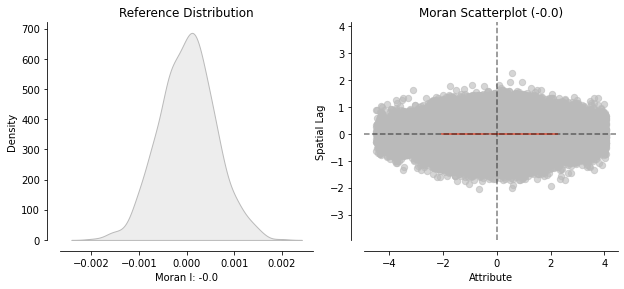

In [ ]:
from splot.esda import plot_moran

#obtain a quick representation of the statistic that combines the Moran Plot (right) with a graphic of the empirical test that we carry out to obtain p_sim (left):
plot_moran(moran);

## dataTest

In [ ]:
dataTest_coord=pd.concat([dataTest,X_test_coord], axis=1)
dataTest_coord

,Actual,Predicted,residuals,x,y,siteindex
0,NaN,NaN,NaN,586155.0,5404725.0,28.859368
1,NaN,NaN,NaN,579665.0,5397735.0,24.855434
2,NaN,NaN,NaN,511025.0,5446795.0,29.188636
3,NaN,NaN,NaN,386445.0,5435485.0,33.722814
4,NaN,NaN,NaN,575035.0,5398655.0,26.763467
...,...,...,...,...,...,...
953514,39.349241,36.037878,3.311363,NaN,NaN,NaN
953518,46.911415,35.576199,11.335216,NaN,NaN,NaN
953540,44.568615,34.153503,10.415112,NaN,NaN,NaN
953542,37.379526,34.181509,3.198017,NaN,NaN,NaN


In [ ]:
dataTest_coord_point = gpd.GeoDataFrame(dataTest_coord, geometry=gpd.points_from_xy(dataTest_coord.x, dataTest_coord.y))

In [ ]:
dataTest_coord_point.dropna(inplace=True)

In [ ]:
dataTest_coord_point.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 9655 entries, 7 to 95355
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype   
---  ------     --------------  -----   
 0   Actual     9655 non-null   float64 
 1   Predicted  9655 non-null   float64 
 2   residuals  9655 non-null   float64 
 3   x          9655 non-null   float64 
 4   y          9655 non-null   float64 
 5   siteindex  9655 non-null   float64 
 6   geometry   9655 non-null   geometry
dtypes: float64(6), geometry(1)
memory usage: 603.4 KB


In [ ]:
# spatial weights matrix. We will use nearest neighbors 
w = weights.contiguity.Queen.from_dataframe(dataTest_coord_point)
# w.neighbors

In [ ]:
# Row-standardization THE WEIGHTS
w.transform = 'R'

In [ ]:
# calculate the spatial lag of our variable of interest:
dataTest_coord_point['w_Predicted'] = weights.spatial_lag.lag_spatial(w, dataTest_coord_point['Predicted'])

In [ ]:
# the variable of interest is usually standardized by substracting its mean and dividing it by its standard deviation:
dataTest_coord_point['Predicted_std'] = ( dataTest_coord_point['Predicted'] - dataTest_coord_point['Predicted'].mean() )\
                    / dataTest_coord_point['Predicted'].std()

dataTest_coord_point['w_Predicted_std'] = ( dataTest_coord_point['w_Predicted'] - dataTest_coord_point['w_Predicted'].mean() )\
                    / dataTest_coord_point['w_Predicted'].std()

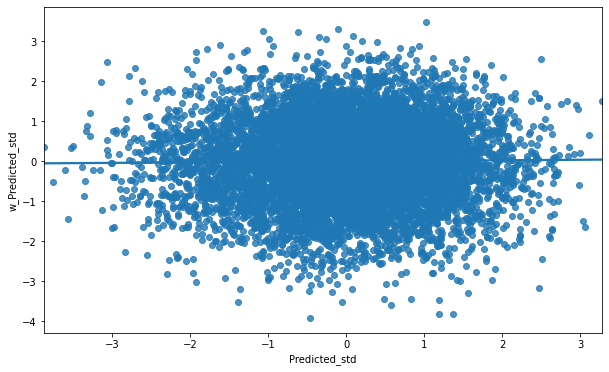

In [ ]:
# creating a Moran Plot

# Setup the figure and axis
f, ax = plt.subplots(1, figsize=(10, 6))
# Plot values
seaborn.regplot(x='Predicted_std', y='w_Predicted_std', data=dataTest_coord_point, ci=None)
# Display
plt.show()

In [ ]:
# retrieve the value of the statistic
moran = esda.moran.Moran(dataTest_coord_point['Predicted'], w)

In [ ]:
#retrieve the value of the statistic
moran.I
# 0.0055366336643759735
#0.005536633664375971

0.0055366336643759735

In [ ]:
moran.p_sim
# 0.177
#0.185

0.177

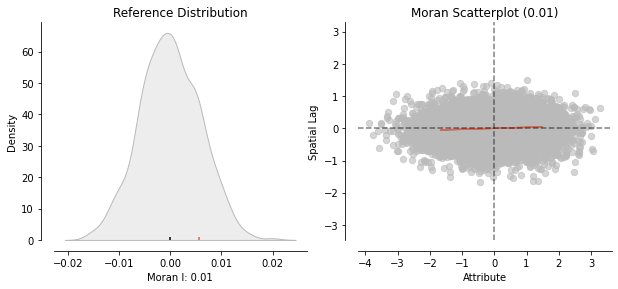

In [ ]:
from splot.esda import plot_moran

#obtain a quick representation of the statistic that combines the Moran Plot (right) with a graphic of the empirical test that we carry out to obtain p_sim (left):
plot_moran(moran);

On the left panel we can see in grey the empirical distribution generated from simulating 999 random maps with the values of the Predicted variable and then calculating Moran’s I for each of those maps. 

The blue rug signals the mean.

In contrary, the red rug shows Moran’s I calculated for the variable using the geography observed in the dataset.

The value under the observed pattern is slightly higher than under randomness. 

This insight is confirmed on the right panel, where there is displayed an equivalent plot to the Moran Plot we created above.

## dataTest Residuals | Linear

In [ ]:
# calculate the spatial lag of our variable of interest:
dataTest_coord_point['w_residuals'] = weights.spatial_lag.lag_spatial(w, dataTest_coord_point['residuals'])

In [ ]:
# the variable of interest is usually standardized by substracting its mean and dividing it by its standard deviation:
dataTest_coord_point['residuals_std'] = ( dataTest_coord_point['residuals'] - dataTest_coord_point['residuals'].mean() )\
                    / dataTest_coord_point['residuals'].std()

dataTest_coord_point['w_residuals_std'] = ( dataTest_coord_point['w_residuals'] - dataTest_coord_point['w_residuals'].mean() )\
                    / dataTest_coord_point['w_residuals'].std()

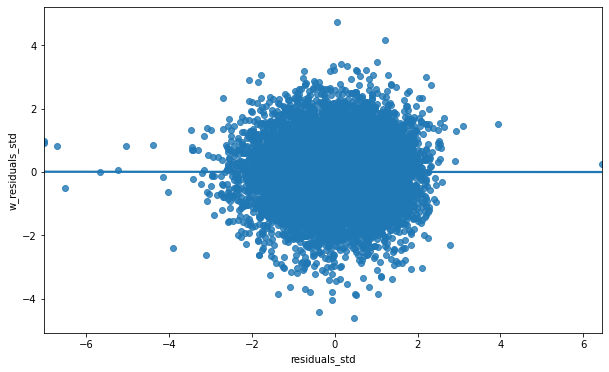

In [ ]:
# creating a Moran Plot

# Setup the figure and axis
f, ax = plt.subplots(1, figsize=(10, 6))
# Plot values
seaborn.regplot(x='residuals_std', y='w_residuals_std', data=dataTest_coord_point, ci=None)
# Display
plt.show()

In [ ]:
# retrieve the value of the statistic
moran = esda.moran.Moran(dataTest_coord_point['residuals'], w)

In [ ]:
#retrieve the value of the statistic
moran.I
# -0.0002874328215787151

-0.0002874328215787151

In [ ]:
moran.p_sim
# 0.472

0.472

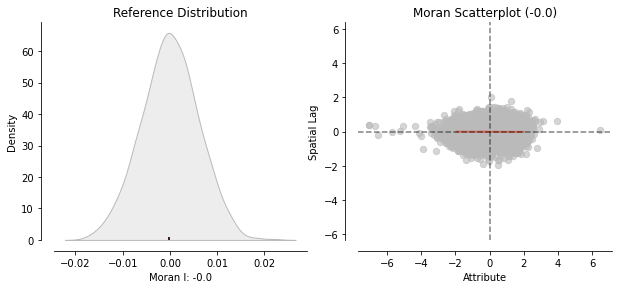

In [ ]:
from splot.esda import plot_moran

#obtain a quick representation of the statistic that combines the Moran Plot (right) with a graphic of the empirical test that we carry out to obtain p_sim (left):
plot_moran(moran);

## dataTest Residuals | Polynomial

In [ ]:
dataTest_coord=pd.concat([dataTest,X_test_coord], axis=1)
dataTest_coord

,Actual,Predicted,residuals,x,y,siteindex
0,NaN,NaN,NaN,586155.0,5404725.0,28.859368
1,NaN,NaN,NaN,579665.0,5397735.0,24.855434
2,NaN,NaN,NaN,511025.0,5446795.0,29.188636
3,NaN,NaN,NaN,386445.0,5435485.0,33.722814
4,NaN,NaN,NaN,575035.0,5398655.0,26.763467
...,...,...,...,...,...,...
953514,39.349241,39.296183,0.053058,NaN,NaN,NaN
953518,46.911415,39.026438,7.884977,NaN,NaN,NaN
953540,44.568615,38.677140,5.891475,NaN,NaN,NaN
953542,37.379526,38.617099,-1.237573,NaN,NaN,NaN


In [ ]:
dataTest_coord_point = gpd.GeoDataFrame(dataTest_coord, geometry=gpd.points_from_xy(dataTest_coord.x, dataTest_coord.y))

In [ ]:
dataTest_coord_point.dropna(inplace=True)

In [ ]:
dataTest_coord_point

,Actual,Predicted,residuals,x,y,siteindex,geometry
7,27.270645,29.446268,-2.175623,443385.0,5408385.0,28.247021,POINT (443385.000 5408385.000)
14,37.213879,35.868800,1.345079,451985.0,5428705.0,38.540209,POINT (451985.000 5428705.000)
18,35.803961,36.161266,-0.357305,585675.0,5406765.0,26.036643,POINT (585675.000 5406765.000)
31,35.849993,35.023372,0.826621,384115.0,5438405.0,33.266733,POINT (384115.000 5438405.000)
36,30.865122,32.531782,-1.666660,451975.0,5405775.0,34.411906,POINT (451975.000 5405775.000)
...,...,...,...,...,...,...,...
95318,29.820216,31.425295,-1.605079,451885.0,5427925.0,36.207018,POINT (451885.000 5427925.000)
95331,31.427374,30.767087,0.660287,451615.0,5427755.0,36.638401,POINT (451615.000 5427755.000)
95344,24.310453,29.421547,-5.111094,512425.0,5448725.0,31.420561,POINT (512425.000 5448725.000)
95346,33.757467,30.665502,3.091965,521295.0,5444745.0,32.332529,POINT (521295.000 5444745.000)


In [ ]:
# spatial weights matrix. We will use nearest neighbors 
w = weights.contiguity.Queen.from_dataframe(dataTest_coord_point)

In [ ]:
# Row-standardization THE WEIGHTS
w.transform = 'R'

In [ ]:
# calculate the spatial lag of our variable of interest:
dataTest_coord_point['w_residuals'] = weights.spatial_lag.lag_spatial(w, dataTest_coord_point['residuals'])

In [ ]:
# the variable of interest is usually standardized by substracting its mean and dividing it by its standard deviation:
dataTest_coord_point['residuals_std'] = ( dataTest_coord_point['residuals'] - dataTest_coord_point['residuals'].mean() )\
                    / dataTest_coord_point['residuals'].std()

dataTest_coord_point['w_residuals_std'] = ( dataTest_coord_point['w_residuals'] - dataTest_coord_point['w_residuals'].mean() )\
                    / dataTest_coord_point['w_residuals'].std()

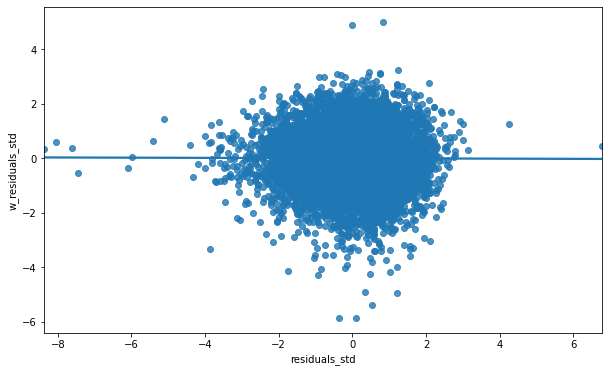

In [ ]:
# creating a Moran Plot

# Setup the figure and axis
f, ax = plt.subplots(1, figsize=(10, 6))
# Plot values
seaborn.regplot(x='residuals_std', y='w_residuals_std', data=dataTest_coord_point, ci=None)
# Display
plt.show()

In [ ]:
# retrieve the value of the statistic
moran = esda.moran.Moran(dataTest_coord_point['residuals'], w)

In [ ]:
#retrieve the value of the statistic
moran.I
# -0.0015285569645116612

-0.0015285569645116612

In [ ]:
moran.p_sim
# 0.419

0.419

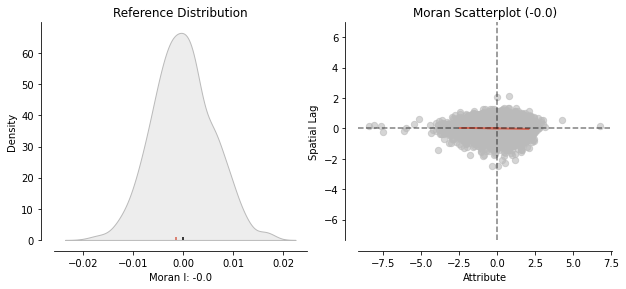

In [ ]:
from splot.esda import plot_moran

#obtain a quick representation of the statistic that combines the Moran Plot (right) with a graphic of the empirical test that we carry out to obtain p_sim (left):
plot_moran(moran);